In [1]:
# pip install --upgrade pip

In [2]:
# pip install tensorflow

In [3]:
import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
import numpy as np
from numpy.linalg import norm
import os
from tqdm import tqdm
import pickle
import pandas as pd
from io import BytesIO
from PIL import Image
from urllib import request

In [10]:
#data = pd.read_csv('/content/drive/MyDrive/Microsoft Engage/myntra.csv')
data = pd.read_csv(r'C:\Users\yjaye\Desktop\Rapid-crew\Notebook\myntra.csv')


In [11]:
data.head()

,Unnamed: 0,product_id,size,brand,dominant_material,title,actual_color,dominant_color,product_type,body,...,complete_the_look,variant_price,variant_compare_at_price,ideal_for,inventory,specifications,img1,img3,img2,img4
0,0,6658,XS,Global Desi,viscose,Global Desi Women Red & Pink Printed Tunic,Pink | Red,Red,Tunic,"Red and Pink printed Tunic, has a round neck, ...",...,Taking the bright colours of summer and nature...,1799,1799,Women,,Occasion : Ethnic | Main Trend : New Basics | ...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
1,1,476,34,Jaipur Kurti,cotton,Jaipur Kurti Women Blue Printed Maxi Flared S...,Blue,Blue,Maxi Flared Skirt,"Blue woven printed maxi flared skirt, has an e...",...,Elevate your style quotient with this maxi ski...,873,2299,Women,15,Knit or Woven : Woven | Transparency : Opaque ...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
2,2,3804,M,20Dresses,Viscose Rayon,20Dresses Women Black & Blue Printed Maxi Dress,Black | Blue,Black,Maxi Dress,"Black and blue printed woven maxi dress, has a...",...,Set the tone for this season with this one-of-...,1516,1895,Women,Knit or Woven : Woven | Transparency : Opaque ...,NaN,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
3,3,7300,Onesize,9rasa,Cotton,9rasa Black Block Print Palazzos,Black,Black,Palazzos,"Black block print mid-rise palazzo trousers, h...",...,The latest range of palazzo trousers from 9ras...,1299,1299,Women,,Pattern : Printed | Transparency : Opaque | Bo...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...
4,4,3312,1-2Y,A.T.U.N All Things Uber Nice,polyester,A.T.U.N All Things Uber Nice Girls Mustard Yel...,Yellow | Maroon | Mustard,Mustard,Lehenga Choli with Dupatta,Mustard yellow and maroon lehenga choli with d...,...,Give your little princess the style and fabulo...,1199,2999,Girls,Dupatta Fabric : Net | Occasion : Festive | Nu...,NaN,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...,http://assets.myntassets.com/v1/assets/images/...


In [12]:
url = data['img1'].iloc[15]
url = url + "?tr=w-224,h-224"
url

'http://assets.myntassets.com/v1/assets/images/2066774/2017/9/7/11504787369636-AKKRITI-BY-PANTALOONS-Women-Skirts-9441504787369484-1.jpg?tr=w-224,h-224'

http://assets.myntassets.com/v1/assets/images/2066774/2017/9/7/11504787369636-AKKRITI-BY-PANTALOONS-Women-Skirts-9441504787369484-1.jpg?tr=w-224,h-224
b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x06\x04\x05\x06\x05\x04\x06\x06\x05\x06\x07\x07\x06\x08\n\x10\n\n\t\t\n\x14\x0e\x0f\x0c\x10\x17\x14\x18\x18\x17\x14\x16\x16\x1a\x1d%\x1f\x1a\x1b#\x1c\x16\x16 , #&\')*)\x19\x1f-0-(0%()(\xff\xdb\x00C\x01\x07\x07\x07\n\x08\n\x13\n\n\x13(\x1a\x16\x1a((((((((((((((((((((((((((((((((((((((((((((((((((\xff\xc0\x00\x11\x08\x05\xa0\x048\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\

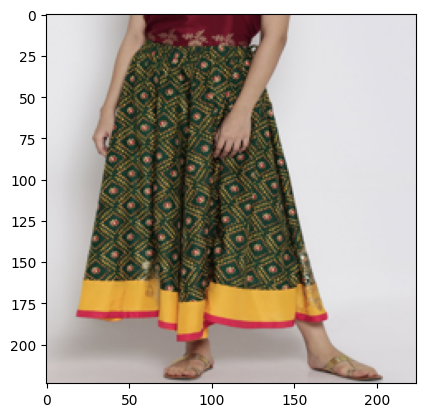

In [13]:
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
from urllib import request

print(url)
res = request.urlopen(url).read()
print(res)
img = Image.open(BytesIO(res)).resize((224,224))
print(img)
plt.imshow(img)

In [14]:
img_array = image.img_to_array(img)
img_array.shape

(224, 224, 3)

In [15]:
expanded_img_array = np.expand_dims(img, axis=0)

expanded_img_array.shape

(1, 224, 224, 3)

In [16]:
preprocessed_img = preprocess_input(expanded_img_array)
preprocessed_img.shape

(1, 224, 224, 3)

In [17]:
model = ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))
model.trainable = False

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 20s 0us/step


In [18]:
model = tensorflow.keras.Sequential([
    model,
    GlobalMaxPooling2D()
])


In [19]:
vgg = VGG16(include_top=False,
    weights="imagenet",
    
    input_shape=(224,224,3))
vgg.output

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 18s 0us/step


<KerasTensor shape=(None, 7, 7, 512), dtype=float32, sparse=False, name=keras_tensor_196>

In [20]:
for layer in vgg.layers:
  layer.trainabe = False

In [21]:
vgg_model = tensorflow.keras.Sequential([
    vgg,
    GlobalMaxPooling2D()
])


In [22]:
images = []

for i in range(data.shape[0]):
  images.append(data['img1'].iloc[i])

print(images[0])

http://assets.myntassets.com/v1/assets/images/10247017/2019/7/19/89db9fec-b898-4ce0-bd4b-e84095b2154e1563516226861-Global-Desi-Women-Tunics-4441563516225272-1.jpg


In [24]:
vgg_feature_list = []
for url in tqdm(images):
  res = request.urlopen(url).read()
  img = Image.open(BytesIO(res)).resize((224,224))
  img_array = image.img_to_array(img)
  # print(img_array)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)

  result = vgg_model.predict(preprocessed_img).flatten()
  
  normalized_result = result / norm(result)
  vgg_feature_list.append(normalized_result)

  0%|          | 0/7432 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


  0%|          | 1/7432 [00:00<1:10:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


  0%|          | 2/7432 [00:01<1:10:40,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  0%|          | 3/7432 [00:01<1:06:11,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  0%|          | 4/7432 [00:02<1:05:07,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  0%|          | 5/7432 [00:02<1:03:40,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


  0%|          | 6/7432 [00:03<1:09:28,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


  0%|          | 7/7432 [00:03<1:13:58,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


  0%|          | 8/7432 [00:04<1:16:47,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


  0%|          | 9/7432 [00:05<1:18:05,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


  0%|          | 10/7432 [00:05<1:19:23,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


  0%|          | 11/7432 [00:06<1:24:15,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


  0%|          | 12/7432 [00:07<1:25:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


  0%|          | 13/7432 [00:08<1:22:18,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


  0%|          | 14/7432 [00:08<1:22:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


  0%|          | 15/7432 [00:09<1:21:58,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


  0%|          | 16/7432 [00:10<1:21:07,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


  0%|          | 17/7432 [00:10<1:18:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  0%|          | 18/7432 [00:11<1:20:12,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


  0%|          | 19/7432 [00:11<1:19:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


  0%|          | 20/7432 [00:12<1:20:29,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


  0%|          | 21/7432 [00:13<1:18:41,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


  0%|          | 22/7432 [00:13<1:14:44,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  0%|          | 23/7432 [00:14<1:10:45,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


  0%|          | 24/7432 [00:14<1:08:14,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


  0%|          | 25/7432 [00:15<1:07:28,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  0%|          | 26/7432 [00:15<1:05:24,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  0%|          | 27/7432 [00:16<1:03:23,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


  0%|          | 28/7432 [00:16<1:03:06,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


  0%|          | 29/7432 [00:17<1:06:03,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  0%|          | 30/7432 [00:17<1:03:57,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  0%|          | 31/7432 [00:18<1:04:58,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


  0%|          | 32/7432 [00:18<1:06:47,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


  0%|          | 33/7432 [00:19<1:10:54,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


  0%|          | 34/7432 [00:20<1:11:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


  0%|          | 35/7432 [00:20<1:13:50,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


  0%|          | 36/7432 [00:21<1:13:47,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


  0%|          | 37/7432 [00:22<1:13:45,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


  1%|          | 38/7432 [00:22<1:14:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


  1%|          | 39/7432 [00:23<1:14:36,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step


  1%|          | 40/7432 [00:24<1:23:30,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


  1%|          | 41/7432 [00:24<1:23:09,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


  1%|          | 42/7432 [00:25<1:15:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  1%|          | 43/7432 [00:25<1:11:57,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


  1%|          | 44/7432 [00:26<1:10:27,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


  1%|          | 45/7432 [00:26<1:10:32,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


  1%|          | 46/7432 [00:27<1:10:39,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


  1%|          | 47/7432 [00:28<1:11:13,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


  1%|          | 48/7432 [00:28<1:13:19,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  1%|          | 49/7432 [00:29<1:09:10,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


  1%|          | 50/7432 [00:29<1:14:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  1%|          | 51/7432 [00:30<1:18:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


  1%|          | 52/7432 [00:31<1:19:07,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


  1%|          | 53/7432 [00:32<1:25:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  1%|          | 54/7432 [00:32<1:28:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


  1%|          | 55/7432 [00:33<1:29:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


  1%|          | 56/7432 [00:34<1:28:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 57/7432 [00:37<2:51:02,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 58/7432 [00:39<3:18:28,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 59/7432 [00:41<3:53:25,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  1%|          | 60/7432 [00:43<3:34:09,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 61/7432 [00:45<3:51:43,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 62/7432 [00:48<4:42:01,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  1%|          | 63/7432 [00:51<4:54:51,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step


  1%|          | 64/7432 [00:52<4:01:40,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


  1%|          | 65/7432 [00:53<3:16:08,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


  1%|          | 66/7432 [00:54<2:50:44,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


  1%|          | 67/7432 [00:54<2:24:39,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step


  1%|          | 68/7432 [00:55<2:16:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


  1%|          | 69/7432 [00:56<2:06:23,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


  1%|          | 70/7432 [00:57<2:21:06,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


  1%|          | 71/7432 [00:59<2:51:05,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


  1%|          | 72/7432 [01:00<2:39:34,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


  1%|          | 73/7432 [01:01<2:18:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


  1%|          | 74/7432 [01:02<2:00:18,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


  1%|          | 75/7432 [01:02<1:45:33,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


  1%|          | 76/7432 [01:03<1:37:33,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


  1%|          | 77/7432 [01:04<1:32:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


  1%|          | 78/7432 [01:04<1:32:35,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


  1%|          | 79/7432 [01:05<1:31:51,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


  1%|          | 80/7432 [01:06<1:34:47,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


  1%|          | 81/7432 [01:07<1:35:16,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


  1%|          | 82/7432 [01:08<1:47:19,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


  1%|          | 83/7432 [01:09<1:41:56,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


  1%|          | 84/7432 [01:12<3:16:53,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


  1%|          | 85/7432 [01:13<2:38:43,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


  1%|          | 86/7432 [01:13<2:16:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


  1%|          | 87/7432 [01:14<1:56:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


  1%|          | 88/7432 [01:15<1:43:37,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


  1%|          | 89/7432 [01:15<1:38:09,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step


  1%|          | 90/7432 [01:16<1:45:48,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


  1%|          | 91/7432 [01:18<2:13:57,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


  1%|          | 92/7432 [01:19<2:05:57,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  1%|▏         | 93/7432 [01:20<2:12:57,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  1%|▏         | 94/7432 [01:22<2:40:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  1%|▏         | 95/7432 [01:24<3:10:40,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


  1%|▏         | 96/7432 [01:25<2:48:11,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


  1%|▏         | 97/7432 [01:26<2:21:41,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  1%|▏         | 98/7432 [01:26<2:04:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


  1%|▏         | 99/7432 [01:27<1:49:23,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


  1%|▏         | 100/7432 [01:27<1:39:46,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


  1%|▏         | 101/7432 [01:28<1:34:56,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


  1%|▏         | 102/7432 [01:29<1:40:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


  1%|▏         | 103/7432 [01:30<1:50:49,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


  1%|▏         | 104/7432 [01:31<1:41:19,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


  1%|▏         | 105/7432 [01:31<1:33:35,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


  1%|▏         | 106/7432 [01:32<1:33:42,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  1%|▏         | 107/7432 [01:33<1:29:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


  1%|▏         | 108/7432 [01:33<1:24:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


  1%|▏         | 109/7432 [01:34<1:23:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


  1%|▏         | 110/7432 [01:35<1:28:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


  1%|▏         | 111/7432 [01:36<1:25:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  2%|▏         | 112/7432 [01:36<1:24:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


  2%|▏         | 113/7432 [01:37<1:22:01,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  2%|▏         | 114/7432 [01:38<1:46:25,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


  2%|▏         | 115/7432 [01:40<2:03:16,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


  2%|▏         | 116/7432 [01:40<2:00:21,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  2%|▏         | 117/7432 [01:43<2:39:11,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


  2%|▏         | 118/7432 [01:44<2:44:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


  2%|▏         | 119/7432 [01:46<3:00:01,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


  2%|▏         | 120/7432 [01:47<2:35:20,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


  2%|▏         | 121/7432 [01:47<2:08:45,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


  2%|▏         | 122/7432 [01:48<1:49:22,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


  2%|▏         | 123/7432 [01:48<1:38:00,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


  2%|▏         | 124/7432 [01:49<1:41:32,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


  2%|▏         | 125/7432 [01:50<1:48:48,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


  2%|▏         | 126/7432 [01:51<1:40:30,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


  2%|▏         | 127/7432 [01:51<1:31:00,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


  2%|▏         | 128/7432 [01:52<1:25:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


  2%|▏         | 129/7432 [01:53<1:21:13,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


  2%|▏         | 130/7432 [01:53<1:16:47,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


  2%|▏         | 131/7432 [01:54<1:13:26,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


  2%|▏         | 132/7432 [01:54<1:11:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


  2%|▏         | 133/7432 [01:55<1:17:44,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step


  2%|▏         | 134/7432 [01:57<1:51:51,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


  2%|▏         | 135/7432 [01:58<1:55:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


  2%|▏         | 136/7432 [01:58<1:42:55,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  2%|▏         | 137/7432 [02:00<2:25:12,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


  2%|▏         | 138/7432 [02:01<2:02:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


  2%|▏         | 139/7432 [02:01<1:49:00,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


  2%|▏         | 140/7432 [02:02<1:36:59,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


  2%|▏         | 141/7432 [02:03<1:28:12,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


  2%|▏         | 142/7432 [02:03<1:23:05,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


  2%|▏         | 143/7432 [02:04<1:17:46,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


  2%|▏         | 144/7432 [02:04<1:14:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


  2%|▏         | 145/7432 [02:05<1:11:27,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


  2%|▏         | 146/7432 [02:05<1:12:15,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


  2%|▏         | 147/7432 [02:06<1:13:34,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


  2%|▏         | 148/7432 [02:07<1:11:56,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


  2%|▏         | 149/7432 [02:07<1:19:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


  2%|▏         | 150/7432 [02:09<2:09:08,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


  2%|▏         | 151/7432 [02:11<2:25:27,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


  2%|▏         | 152/7432 [02:13<2:49:27,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


  2%|▏         | 153/7432 [02:13<2:25:42,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step


  2%|▏         | 154/7432 [02:14<2:16:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


  2%|▏         | 155/7432 [02:15<2:09:55,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


  2%|▏         | 156/7432 [02:16<1:56:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


  2%|▏         | 157/7432 [02:17<1:46:46,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


  2%|▏         | 158/7432 [02:17<1:41:40,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


  2%|▏         | 159/7432 [02:18<1:41:47,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


  2%|▏         | 160/7432 [02:19<1:36:33,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


  2%|▏         | 161/7432 [02:20<1:36:48,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


  2%|▏         | 162/7432 [02:21<1:34:44,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  2%|▏         | 163/7432 [02:21<1:30:32,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step


  2%|▏         | 164/7432 [02:22<1:34:02,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


  2%|▏         | 165/7432 [02:23<1:30:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


  2%|▏         | 166/7432 [02:24<1:32:38,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  2%|▏         | 167/7432 [02:24<1:29:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


  2%|▏         | 168/7432 [02:25<1:31:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


  2%|▏         | 169/7432 [02:26<1:31:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


  2%|▏         | 170/7432 [02:27<1:35:31,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


  2%|▏         | 171/7432 [02:29<2:38:30,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


  2%|▏         | 172/7432 [02:31<2:48:24,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step


  2%|▏         | 173/7432 [02:32<2:47:45,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


  2%|▏         | 174/7432 [02:33<2:18:01,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


  2%|▏         | 175/7432 [02:34<2:06:10,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


  2%|▏         | 176/7432 [02:34<1:56:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


  2%|▏         | 177/7432 [02:35<1:47:48,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


  2%|▏         | 178/7432 [02:36<1:37:44,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


  2%|▏         | 179/7432 [02:36<1:38:05,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


  2%|▏         | 180/7432 [02:37<1:34:08,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 833ms/step


  2%|▏         | 181/7432 [02:38<1:40:58,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  2%|▏         | 182/7432 [02:40<2:04:38,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step


  2%|▏         | 183/7432 [02:41<2:07:01,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 709ms/step


  2%|▏         | 184/7432 [02:42<2:03:22,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  2%|▏         | 185/7432 [02:43<2:24:50,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


  3%|▎         | 186/7432 [02:44<2:11:26,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


  3%|▎         | 187/7432 [02:45<2:02:39,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  3%|▎         | 188/7432 [02:46<1:50:33,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


  3%|▎         | 189/7432 [02:46<1:43:30,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


  3%|▎         | 190/7432 [02:47<1:37:48,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  3%|▎         | 191/7432 [02:48<1:32:05,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


  3%|▎         | 192/7432 [02:48<1:30:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


  3%|▎         | 193/7432 [02:49<1:27:30,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  3%|▎         | 194/7432 [02:50<1:26:02,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  3%|▎         | 195/7432 [02:50<1:24:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  3%|▎         | 196/7432 [02:51<1:23:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


  3%|▎         | 197/7432 [02:52<1:27:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


  3%|▎         | 198/7432 [02:54<2:04:23,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 801ms/step


  3%|▎         | 199/7432 [02:55<2:20:23,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


  3%|▎         | 200/7432 [02:56<2:01:49,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


  3%|▎         | 201/7432 [02:57<1:54:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


  3%|▎         | 202/7432 [02:57<1:43:57,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  3%|▎         | 203/7432 [02:58<1:36:31,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


  3%|▎         | 204/7432 [02:59<1:34:18,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


  3%|▎         | 205/7432 [02:59<1:33:12,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


  3%|▎         | 206/7432 [03:00<1:33:57,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


  3%|▎         | 207/7432 [03:01<1:33:14,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


  3%|▎         | 208/7432 [03:02<1:43:16,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


  3%|▎         | 209/7432 [03:04<2:23:19,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


  3%|▎         | 210/7432 [03:05<2:04:22,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


  3%|▎         | 211/7432 [03:05<1:53:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


  3%|▎         | 212/7432 [03:06<1:50:04,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  3%|▎         | 213/7432 [03:08<2:03:09,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


  3%|▎         | 214/7432 [03:09<2:15:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


  3%|▎         | 215/7432 [03:10<2:00:21,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


  3%|▎         | 216/7432 [03:10<1:56:19,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


  3%|▎         | 217/7432 [03:11<1:48:33,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


  3%|▎         | 218/7432 [03:12<1:42:19,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


  3%|▎         | 219/7432 [03:13<1:37:11,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


  3%|▎         | 220/7432 [03:13<1:35:27,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


  3%|▎         | 221/7432 [03:14<1:31:26,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


  3%|▎         | 222/7432 [03:15<1:28:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  3%|▎         | 223/7432 [03:15<1:26:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


  3%|▎         | 224/7432 [03:16<1:25:19,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  3%|▎         | 225/7432 [03:17<1:24:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  3%|▎         | 226/7432 [03:18<1:26:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


  3%|▎         | 227/7432 [03:18<1:27:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  3%|▎         | 228/7432 [03:21<2:43:55,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


  3%|▎         | 229/7432 [03:23<3:08:18,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  3%|▎         | 230/7432 [03:24<2:35:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


  3%|▎         | 231/7432 [03:25<2:13:33,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


  3%|▎         | 232/7432 [03:25<1:57:26,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


  3%|▎         | 233/7432 [03:26<1:46:23,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


  3%|▎         | 234/7432 [03:27<1:50:48,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


  3%|▎         | 235/7432 [03:28<2:09:33,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step


  3%|▎         | 236/7432 [03:29<2:07:50,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


  3%|▎         | 237/7432 [03:30<1:57:40,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step


  3%|▎         | 238/7432 [03:31<1:49:47,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


  3%|▎         | 239/7432 [03:32<1:43:48,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


  3%|▎         | 240/7432 [03:33<1:41:21,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


  3%|▎         | 241/7432 [03:33<1:34:57,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 695ms/step


  3%|▎         | 242/7432 [03:34<1:37:02,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


  3%|▎         | 243/7432 [03:35<1:31:51,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 767ms/step


  3%|▎         | 244/7432 [03:36<1:38:09,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


  3%|▎         | 245/7432 [03:37<2:05:13,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


  3%|▎         | 246/7432 [03:39<2:28:25,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


  3%|▎         | 247/7432 [03:40<2:13:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step


  3%|▎         | 248/7432 [03:41<2:01:59,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


  3%|▎         | 249/7432 [03:41<1:51:55,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


  3%|▎         | 250/7432 [03:42<1:44:22,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


  3%|▎         | 251/7432 [03:43<1:38:56,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


  3%|▎         | 252/7432 [03:43<1:34:44,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


  3%|▎         | 253/7432 [03:44<1:31:21,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step


  3%|▎         | 254/7432 [03:45<1:34:43,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


  3%|▎         | 255/7432 [03:46<1:28:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


  3%|▎         | 256/7432 [03:46<1:26:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


  3%|▎         | 257/7432 [03:47<1:24:06,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


  3%|▎         | 258/7432 [03:48<1:22:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


  3%|▎         | 259/7432 [03:48<1:20:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


  3%|▎         | 260/7432 [03:49<1:19:19,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


  4%|▎         | 261/7432 [03:50<1:21:24,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


  4%|▎         | 262/7432 [03:50<1:19:59,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step


  4%|▎         | 263/7432 [03:51<1:32:29,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


  4%|▎         | 264/7432 [03:53<2:19:41,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step


  4%|▎         | 265/7432 [03:55<2:39:27,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


  4%|▎         | 266/7432 [03:56<2:14:05,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


  4%|▎         | 267/7432 [03:56<1:56:17,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  4%|▎         | 268/7432 [03:57<1:45:16,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


  4%|▎         | 269/7432 [03:58<1:36:20,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


  4%|▎         | 270/7432 [03:58<1:30:07,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


  4%|▎         | 271/7432 [03:59<1:26:20,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


  4%|▎         | 272/7432 [04:00<1:25:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


  4%|▎         | 273/7432 [04:00<1:27:41,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


  4%|▎         | 274/7432 [04:01<1:26:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


  4%|▎         | 275/7432 [04:02<1:23:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  4%|▎         | 276/7432 [04:02<1:21:04,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


  4%|▎         | 277/7432 [04:03<1:19:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


  4%|▎         | 278/7432 [04:04<1:17:09,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


  4%|▍         | 279/7432 [04:04<1:17:37,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


  4%|▍         | 280/7432 [04:05<1:16:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


  4%|▍         | 281/7432 [04:06<1:16:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  4%|▍         | 282/7432 [04:06<1:17:13,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


  4%|▍         | 283/7432 [04:07<1:22:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  4%|▍         | 284/7432 [04:08<1:21:11,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


  4%|▍         | 285/7432 [04:08<1:21:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


  4%|▍         | 286/7432 [04:09<1:24:40,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


  4%|▍         | 287/7432 [04:10<1:27:51,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  4%|▍         | 288/7432 [04:11<1:46:28,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


  4%|▍         | 289/7432 [04:12<1:58:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


  4%|▍         | 290/7432 [04:14<2:12:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


  4%|▍         | 291/7432 [04:15<1:59:07,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


  4%|▍         | 292/7432 [04:15<1:45:50,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


  4%|▍         | 293/7432 [04:16<1:37:32,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


  4%|▍         | 294/7432 [04:16<1:31:13,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


  4%|▍         | 295/7432 [04:17<1:28:13,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


  4%|▍         | 296/7432 [04:18<1:23:43,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


  4%|▍         | 297/7432 [04:18<1:20:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


  4%|▍         | 298/7432 [04:19<1:19:39,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  4%|▍         | 299/7432 [04:20<1:19:12,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


  4%|▍         | 300/7432 [04:20<1:22:23,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


  4%|▍         | 301/7432 [04:21<1:22:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  4%|▍         | 302/7432 [04:22<1:21:05,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


  4%|▍         | 303/7432 [04:22<1:19:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  4%|▍         | 304/7432 [04:23<1:18:51,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


  4%|▍         | 305/7432 [04:24<1:19:15,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  4%|▍         | 306/7432 [04:24<1:19:54,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


  4%|▍         | 307/7432 [04:25<1:19:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


  4%|▍         | 308/7432 [04:26<1:17:55,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


  4%|▍         | 309/7432 [04:26<1:16:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


  4%|▍         | 310/7432 [04:27<1:17:14,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  4%|▍         | 311/7432 [04:28<1:17:00,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


  4%|▍         | 312/7432 [04:28<1:17:41,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step


  4%|▍         | 313/7432 [04:29<1:28:38,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


  4%|▍         | 314/7432 [04:31<2:16:40,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


  4%|▍         | 315/7432 [04:33<2:26:43,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


  4%|▍         | 316/7432 [04:33<2:07:06,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


  4%|▍         | 317/7432 [04:34<1:51:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 721ms/step


  4%|▍         | 318/7432 [04:35<1:49:14,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


  4%|▍         | 319/7432 [04:36<1:38:14,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


  4%|▍         | 320/7432 [04:36<1:32:33,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  4%|▍         | 321/7432 [04:37<1:29:53,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


  4%|▍         | 322/7432 [04:38<1:25:23,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


  4%|▍         | 323/7432 [04:38<1:26:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


  4%|▍         | 324/7432 [04:39<1:23:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


  4%|▍         | 325/7432 [04:40<1:23:01,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


  4%|▍         | 326/7432 [04:40<1:25:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


  4%|▍         | 327/7432 [04:41<1:24:06,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


  4%|▍         | 328/7432 [04:42<1:22:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


  4%|▍         | 329/7432 [04:43<1:23:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step


  4%|▍         | 330/7432 [04:43<1:25:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  4%|▍         | 331/7432 [04:44<1:24:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


  4%|▍         | 332/7432 [04:45<1:21:11,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  4%|▍         | 333/7432 [04:45<1:22:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step


  4%|▍         | 334/7432 [04:46<1:35:02,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  5%|▍         | 335/7432 [04:48<2:07:41,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 788ms/step


  5%|▍         | 336/7432 [04:49<2:06:48,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  5%|▍         | 337/7432 [04:53<3:28:57,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


  5%|▍         | 338/7432 [04:54<3:01:57,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step


  5%|▍         | 339/7432 [04:55<2:42:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


  5%|▍         | 340/7432 [04:55<2:21:56,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


  5%|▍         | 341/7432 [04:56<2:07:27,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


  5%|▍         | 342/7432 [04:57<1:57:12,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


  5%|▍         | 343/7432 [04:58<1:51:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


  5%|▍         | 344/7432 [04:59<1:45:52,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step


  5%|▍         | 345/7432 [04:59<1:45:17,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 776ms/step


  5%|▍         | 346/7432 [05:00<1:47:34,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step


  5%|▍         | 347/7432 [05:01<1:53:44,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


  5%|▍         | 348/7432 [05:02<1:54:59,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


  5%|▍         | 349/7432 [05:04<1:57:51,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step


  5%|▍         | 350/7432 [05:05<2:01:41,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step


  5%|▍         | 351/7432 [05:06<2:01:49,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


  5%|▍         | 352/7432 [05:07<2:01:00,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 781ms/step


  5%|▍         | 353/7432 [05:08<2:00:08,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


  5%|▍         | 354/7432 [05:12<4:00:23,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


  5%|▍         | 355/7432 [05:13<3:16:59,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


  5%|▍         | 356/7432 [05:14<2:46:56,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


  5%|▍         | 357/7432 [05:15<2:26:14,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


  5%|▍         | 358/7432 [05:16<2:15:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step


  5%|▍         | 359/7432 [05:16<2:05:25,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


  5%|▍         | 360/7432 [05:17<1:53:54,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


  5%|▍         | 361/7432 [05:18<1:42:55,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  5%|▍         | 362/7432 [05:18<1:37:20,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


  5%|▍         | 363/7432 [05:19<1:34:11,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


  5%|▍         | 364/7432 [05:20<1:31:02,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


  5%|▍         | 365/7432 [05:21<1:32:57,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  5%|▍         | 366/7432 [05:23<2:08:32,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  5%|▍         | 367/7432 [05:24<2:37:38,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


  5%|▍         | 368/7432 [05:25<2:19:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 721ms/step


  5%|▍         | 369/7432 [05:26<2:08:09,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


  5%|▍         | 370/7432 [05:27<2:00:56,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


  5%|▍         | 371/7432 [05:28<1:49:35,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


  5%|▌         | 372/7432 [05:29<1:43:07,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


  5%|▌         | 373/7432 [05:29<1:38:39,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step


  5%|▌         | 374/7432 [05:30<1:42:18,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step


  5%|▌         | 375/7432 [05:32<2:08:24,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


  5%|▌         | 376/7432 [05:33<2:06:15,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


  5%|▌         | 377/7432 [05:34<1:53:22,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


  5%|▌         | 378/7432 [05:34<1:43:05,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step


  5%|▌         | 379/7432 [05:35<1:40:25,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  5%|▌         | 380/7432 [05:36<1:55:42,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


  5%|▌         | 381/7432 [05:37<1:56:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


  5%|▌         | 382/7432 [05:38<1:57:49,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 658ms/step


  5%|▌         | 383/7432 [05:39<1:51:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


  5%|▌         | 384/7432 [05:40<1:49:09,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


  5%|▌         | 385/7432 [05:41<1:43:35,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


  5%|▌         | 386/7432 [05:42<1:36:51,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


  5%|▌         | 387/7432 [05:42<1:35:23,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step


  5%|▌         | 388/7432 [05:44<2:06:51,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


  5%|▌         | 389/7432 [05:45<1:51:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


  5%|▌         | 390/7432 [05:45<1:41:33,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  5%|▌         | 391/7432 [05:46<1:34:56,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


  5%|▌         | 392/7432 [05:47<1:35:11,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  5%|▌         | 393/7432 [05:49<2:26:09,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  5%|▌         | 394/7432 [05:50<2:25:57,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step


  5%|▌         | 395/7432 [05:51<2:13:59,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


  5%|▌         | 396/7432 [05:52<2:04:58,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


  5%|▌         | 397/7432 [05:53<1:53:37,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


  5%|▌         | 398/7432 [05:54<1:46:36,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


  5%|▌         | 399/7432 [05:54<1:43:25,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


  5%|▌         | 400/7432 [05:55<1:39:06,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


  5%|▌         | 401/7432 [05:56<1:34:37,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


  5%|▌         | 402/7432 [05:57<1:28:52,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


  5%|▌         | 403/7432 [05:57<1:26:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


  5%|▌         | 404/7432 [05:58<1:26:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


  5%|▌         | 405/7432 [05:59<1:27:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


  5%|▌         | 406/7432 [06:00<1:47:00,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


  5%|▌         | 407/7432 [06:02<2:32:12,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  5%|▌         | 408/7432 [06:04<2:45:36,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  6%|▌         | 409/7432 [06:05<2:38:00,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


  6%|▌         | 410/7432 [06:06<2:16:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step


  6%|▌         | 411/7432 [06:07<2:09:23,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


  6%|▌         | 412/7432 [06:08<2:20:52,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  6%|▌         | 413/7432 [06:09<2:03:21,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


  6%|▌         | 414/7432 [06:10<1:57:14,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  6%|▌         | 415/7432 [06:11<1:45:55,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


  6%|▌         | 416/7432 [06:11<1:38:51,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


  6%|▌         | 417/7432 [06:12<1:35:15,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


  6%|▌         | 418/7432 [06:16<3:10:11,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


  6%|▌         | 419/7432 [06:16<2:35:43,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


  6%|▌         | 420/7432 [06:17<2:08:24,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  6%|▌         | 421/7432 [06:17<1:49:05,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


  6%|▌         | 422/7432 [06:18<1:35:39,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


  6%|▌         | 423/7432 [06:18<1:26:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


  6%|▌         | 424/7432 [06:19<1:19:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


  6%|▌         | 425/7432 [06:19<1:14:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


  6%|▌         | 426/7432 [06:20<1:15:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


  6%|▌         | 427/7432 [06:21<1:11:14,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


  6%|▌         | 428/7432 [06:21<1:11:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


  6%|▌         | 429/7432 [06:22<1:08:40,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


  6%|▌         | 430/7432 [06:23<1:27:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


  6%|▌         | 431/7432 [06:24<1:31:34,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


  6%|▌         | 432/7432 [06:25<1:44:05,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


  6%|▌         | 433/7432 [06:26<1:43:06,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


  6%|▌         | 434/7432 [06:26<1:35:13,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


  6%|▌         | 435/7432 [06:27<1:30:28,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


  6%|▌         | 436/7432 [06:28<1:27:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


  6%|▌         | 437/7432 [06:29<1:25:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  6%|▌         | 438/7432 [06:31<2:25:33,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


  6%|▌         | 439/7432 [06:33<2:50:21,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


  6%|▌         | 440/7432 [06:34<2:21:20,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


  6%|▌         | 441/7432 [06:34<2:00:07,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


  6%|▌         | 442/7432 [06:35<1:45:23,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


  6%|▌         | 443/7432 [06:36<1:43:47,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


  6%|▌         | 444/7432 [06:36<1:36:52,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


  6%|▌         | 445/7432 [06:37<1:29:45,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


  6%|▌         | 446/7432 [06:38<1:23:59,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  6%|▌         | 447/7432 [06:38<1:22:23,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


  6%|▌         | 448/7432 [06:39<1:39:25,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


  6%|▌         | 449/7432 [06:40<1:35:07,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


  6%|▌         | 450/7432 [06:41<1:32:06,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


  6%|▌         | 451/7432 [06:42<1:40:26,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


  6%|▌         | 452/7432 [06:43<1:33:06,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


  6%|▌         | 453/7432 [06:43<1:30:11,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


  6%|▌         | 454/7432 [06:44<1:22:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


  6%|▌         | 455/7432 [06:44<1:16:47,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


  6%|▌         | 456/7432 [06:45<1:16:13,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


  6%|▌         | 457/7432 [06:46<1:16:23,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


  6%|▌         | 458/7432 [06:47<1:49:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


  6%|▌         | 459/7432 [06:48<1:41:48,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


  6%|▌         | 460/7432 [06:49<1:32:32,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


  6%|▌         | 461/7432 [06:49<1:26:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


  6%|▌         | 462/7432 [06:50<1:20:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


  6%|▌         | 463/7432 [06:50<1:17:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


  6%|▌         | 464/7432 [06:51<1:14:07,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


  6%|▋         | 465/7432 [06:52<1:12:05,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


  6%|▋         | 466/7432 [06:52<1:17:34,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


  6%|▋         | 467/7432 [06:53<1:26:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


  6%|▋         | 468/7432 [06:54<1:31:03,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


  6%|▋         | 469/7432 [06:55<1:31:48,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


  6%|▋         | 470/7432 [06:57<2:04:05,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


  6%|▋         | 471/7432 [06:58<2:07:38,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


  6%|▋         | 472/7432 [07:00<2:46:47,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


  6%|▋         | 473/7432 [07:01<2:27:32,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


  6%|▋         | 474/7432 [07:02<2:06:54,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


  6%|▋         | 475/7432 [07:02<1:54:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


  6%|▋         | 476/7432 [07:03<1:52:47,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


  6%|▋         | 477/7432 [07:04<1:48:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


  6%|▋         | 478/7432 [07:05<1:44:51,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


  6%|▋         | 479/7432 [07:06<1:38:35,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


  6%|▋         | 480/7432 [07:07<1:35:04,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


  6%|▋         | 481/7432 [07:07<1:30:29,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  6%|▋         | 482/7432 [07:08<1:29:56,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


  6%|▋         | 483/7432 [07:09<1:35:17,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


  7%|▋         | 484/7432 [07:10<1:41:30,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


  7%|▋         | 485/7432 [07:11<1:36:33,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


  7%|▋         | 486/7432 [07:12<1:45:56,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step


  7%|▋         | 487/7432 [07:13<1:45:32,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


  7%|▋         | 488/7432 [07:14<1:49:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


  7%|▋         | 489/7432 [07:15<1:45:46,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


  7%|▋         | 490/7432 [07:16<2:01:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


  7%|▋         | 491/7432 [07:18<2:26:44,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


  7%|▋         | 492/7432 [07:19<2:23:08,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  7%|▋         | 493/7432 [07:20<2:05:38,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step


  7%|▋         | 494/7432 [07:21<2:07:21,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


  7%|▋         | 495/7432 [07:22<2:11:45,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


  7%|▋         | 496/7432 [07:23<2:04:30,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


  7%|▋         | 497/7432 [07:24<1:54:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


  7%|▋         | 498/7432 [07:24<1:44:46,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


  7%|▋         | 499/7432 [07:25<1:42:58,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


  7%|▋         | 500/7432 [07:26<1:38:25,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


  7%|▋         | 501/7432 [07:27<1:37:34,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


  7%|▋         | 502/7432 [07:28<1:35:46,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  7%|▋         | 503/7432 [07:28<1:30:47,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


  7%|▋         | 504/7432 [07:29<1:44:11,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step


  7%|▋         | 505/7432 [07:31<2:00:49,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  7%|▋         | 506/7432 [07:32<2:07:30,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


  7%|▋         | 507/7432 [07:33<1:55:22,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


  7%|▋         | 508/7432 [07:34<1:46:24,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


  7%|▋         | 509/7432 [07:34<1:41:47,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  7%|▋         | 510/7432 [07:35<1:35:56,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


  7%|▋         | 511/7432 [07:36<1:38:12,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


  7%|▋         | 512/7432 [07:37<1:37:08,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


  7%|▋         | 513/7432 [07:38<1:36:15,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  7%|▋         | 514/7432 [07:39<1:38:49,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  7%|▋         | 515/7432 [07:39<1:38:50,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  7%|▋         | 516/7432 [07:40<1:40:28,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


  7%|▋         | 517/7432 [07:41<1:39:55,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  7%|▋         | 518/7432 [07:42<1:40:44,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


  7%|▋         | 519/7432 [07:43<1:35:41,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


  7%|▋         | 520/7432 [07:44<1:33:31,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


  7%|▋         | 521/7432 [07:44<1:29:51,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


  7%|▋         | 522/7432 [07:45<1:27:43,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


  7%|▋         | 523/7432 [07:46<1:39:49,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


  7%|▋         | 524/7432 [07:47<1:38:32,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


  7%|▋         | 525/7432 [07:48<1:37:39,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


  7%|▋         | 526/7432 [07:49<1:46:32,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


  7%|▋         | 527/7432 [07:52<2:52:57,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


  7%|▋         | 528/7432 [07:53<2:38:48,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


  7%|▋         | 529/7432 [07:53<2:15:22,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


  7%|▋         | 530/7432 [07:54<2:01:31,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


  7%|▋         | 531/7432 [07:55<1:57:37,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


  7%|▋         | 532/7432 [07:56<2:01:20,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


  7%|▋         | 533/7432 [07:57<1:56:50,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


  7%|▋         | 534/7432 [07:58<1:59:49,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


  7%|▋         | 535/7432 [07:59<1:52:59,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


  7%|▋         | 536/7432 [08:00<1:48:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  7%|▋         | 537/7432 [08:01<1:40:34,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


  7%|▋         | 538/7432 [08:02<1:44:27,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  7%|▋         | 539/7432 [08:02<1:37:01,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


  7%|▋         | 540/7432 [08:03<1:32:13,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


  7%|▋         | 541/7432 [08:04<1:34:31,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


  7%|▋         | 542/7432 [08:05<1:32:55,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


  7%|▋         | 543/7432 [08:06<1:29:36,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


  7%|▋         | 544/7432 [08:06<1:26:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


  7%|▋         | 545/7432 [08:07<1:23:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


  7%|▋         | 546/7432 [08:08<1:23:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


  7%|▋         | 547/7432 [08:09<1:39:26,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


  7%|▋         | 548/7432 [08:12<3:02:11,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step


  7%|▋         | 549/7432 [08:13<2:38:15,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  7%|▋         | 550/7432 [08:14<2:14:38,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


  7%|▋         | 551/7432 [08:14<1:57:41,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


  7%|▋         | 552/7432 [08:15<1:51:07,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


  7%|▋         | 553/7432 [08:16<1:49:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


  7%|▋         | 554/7432 [08:17<1:43:25,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


  7%|▋         | 555/7432 [08:18<1:36:44,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


  7%|▋         | 556/7432 [08:18<1:32:24,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


  7%|▋         | 557/7432 [08:19<1:34:43,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


  8%|▊         | 558/7432 [08:20<1:33:38,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


  8%|▊         | 559/7432 [08:21<1:40:53,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


  8%|▊         | 560/7432 [08:22<1:44:27,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


  8%|▊         | 561/7432 [08:23<1:42:02,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


  8%|▊         | 562/7432 [08:24<1:36:39,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


  8%|▊         | 563/7432 [08:24<1:37:21,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


  8%|▊         | 564/7432 [08:25<1:31:11,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  8%|▊         | 565/7432 [08:26<1:30:30,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step


  8%|▊         | 566/7432 [08:27<1:35:51,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


  8%|▊         | 567/7432 [08:30<2:49:31,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


  8%|▊         | 568/7432 [08:31<2:34:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


  8%|▊         | 569/7432 [08:32<2:18:41,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


  8%|▊         | 570/7432 [08:33<2:13:25,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


  8%|▊         | 571/7432 [08:34<2:00:44,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


  8%|▊         | 572/7432 [08:35<1:56:32,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


  8%|▊         | 573/7432 [08:35<1:52:49,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  8%|▊         | 574/7432 [08:37<2:09:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


  8%|▊         | 575/7432 [08:38<2:09:19,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


  8%|▊         | 576/7432 [08:39<1:59:03,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step


  8%|▊         | 577/7432 [08:40<1:59:57,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  8%|▊         | 578/7432 [08:41<2:01:57,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


  8%|▊         | 579/7432 [08:42<1:57:44,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


  8%|▊         | 580/7432 [08:43<1:56:48,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


  8%|▊         | 581/7432 [08:44<1:57:28,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


  8%|▊         | 582/7432 [08:45<2:00:36,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


  8%|▊         | 583/7432 [08:46<1:57:35,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


  8%|▊         | 584/7432 [08:47<1:49:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


  8%|▊         | 585/7432 [08:48<1:47:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step


  8%|▊         | 586/7432 [08:49<1:56:15,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


  8%|▊         | 587/7432 [08:50<1:57:08,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


  8%|▊         | 588/7432 [08:51<1:44:51,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  8%|▊         | 589/7432 [08:52<1:42:11,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


  8%|▊         | 590/7432 [08:52<1:37:48,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


  8%|▊         | 591/7432 [08:53<1:34:42,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


  8%|▊         | 592/7432 [08:55<2:02:16,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


  8%|▊         | 593/7432 [08:57<2:43:00,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step


  8%|▊         | 594/7432 [08:58<2:30:32,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step


  8%|▊         | 595/7432 [09:03<4:20:43,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


  8%|▊         | 596/7432 [09:04<4:05:51,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


  8%|▊         | 597/7432 [09:05<3:22:00,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


  8%|▊         | 598/7432 [09:06<2:47:50,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


  8%|▊         | 599/7432 [09:07<2:26:10,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


  8%|▊         | 600/7432 [09:08<2:08:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


  8%|▊         | 601/7432 [09:09<2:02:58,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


  8%|▊         | 602/7432 [09:10<1:56:07,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


  8%|▊         | 603/7432 [09:10<1:48:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


  8%|▊         | 604/7432 [09:11<1:49:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


  8%|▊         | 605/7432 [09:12<1:43:41,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


  8%|▊         | 606/7432 [09:13<1:43:39,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


  8%|▊         | 607/7432 [09:14<1:44:25,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


  8%|▊         | 608/7432 [09:15<1:35:59,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


  8%|▊         | 609/7432 [09:15<1:29:38,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


  8%|▊         | 610/7432 [09:16<1:28:13,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  8%|▊         | 611/7432 [09:17<1:24:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


  8%|▊         | 612/7432 [09:17<1:23:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


  8%|▊         | 613/7432 [09:18<1:18:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


  8%|▊         | 614/7432 [09:19<1:26:50,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


  8%|▊         | 615/7432 [09:20<1:34:35,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


  8%|▊         | 616/7432 [09:23<2:41:30,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


  8%|▊         | 617/7432 [09:24<2:20:05,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


  8%|▊         | 618/7432 [09:24<2:06:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


  8%|▊         | 619/7432 [09:25<1:53:18,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


  8%|▊         | 620/7432 [09:26<1:41:43,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


  8%|▊         | 621/7432 [09:26<1:35:06,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


  8%|▊         | 622/7432 [09:27<1:25:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


  8%|▊         | 623/7432 [09:28<1:30:53,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


  8%|▊         | 624/7432 [09:29<1:26:41,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


  8%|▊         | 625/7432 [09:29<1:29:12,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


  8%|▊         | 626/7432 [09:30<1:34:53,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


  8%|▊         | 627/7432 [09:31<1:36:02,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


  8%|▊         | 628/7432 [09:32<1:39:51,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


  8%|▊         | 629/7432 [09:33<1:45:26,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


  8%|▊         | 630/7432 [09:34<1:41:27,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


  8%|▊         | 631/7432 [09:35<1:44:14,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


  9%|▊         | 632/7432 [09:36<1:42:22,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


  9%|▊         | 633/7432 [09:37<1:40:53,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


  9%|▊         | 634/7432 [09:38<1:37:50,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


  9%|▊         | 635/7432 [09:38<1:37:46,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


  9%|▊         | 636/7432 [09:41<2:32:57,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


  9%|▊         | 637/7432 [09:43<2:50:27,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


  9%|▊         | 638/7432 [09:44<2:35:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step


  9%|▊         | 639/7432 [09:45<2:25:30,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


  9%|▊         | 640/7432 [09:46<2:14:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step


  9%|▊         | 641/7432 [09:47<2:10:57,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 781ms/step


  9%|▊         | 642/7432 [09:48<2:09:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step


  9%|▊         | 643/7432 [09:49<2:09:40,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


  9%|▊         | 644/7432 [09:50<1:58:46,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step


  9%|▊         | 645/7432 [09:51<1:53:47,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


  9%|▊         | 646/7432 [09:52<1:58:25,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


  9%|▊         | 647/7432 [09:53<1:58:34,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


  9%|▊         | 648/7432 [09:54<1:55:28,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


  9%|▊         | 649/7432 [09:55<1:53:54,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


  9%|▊         | 650/7432 [09:56<1:51:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  9%|▉         | 651/7432 [09:57<1:48:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


  9%|▉         | 652/7432 [09:58<1:42:25,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


  9%|▉         | 653/7432 [09:59<1:52:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


  9%|▉         | 654/7432 [10:00<2:08:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


  9%|▉         | 655/7432 [10:01<2:03:59,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


  9%|▉         | 656/7432 [10:02<2:01:18,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


  9%|▉         | 657/7432 [10:03<1:56:00,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


  9%|▉         | 658/7432 [10:04<1:52:53,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 992ms/step


  9%|▉         | 659/7432 [10:06<2:11:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  9%|▉         | 660/7432 [10:07<2:05:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


  9%|▉         | 661/7432 [10:08<1:56:57,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


  9%|▉         | 662/7432 [10:09<1:49:08,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


  9%|▉         | 663/7432 [10:09<1:48:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


  9%|▉         | 664/7432 [10:10<1:46:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


  9%|▉         | 665/7432 [10:11<1:41:07,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


  9%|▉         | 666/7432 [10:13<2:06:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


  9%|▉         | 667/7432 [10:14<1:57:03,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


  9%|▉         | 668/7432 [10:15<2:12:08,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


  9%|▉         | 669/7432 [10:16<2:05:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


  9%|▉         | 670/7432 [10:17<2:00:56,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


  9%|▉         | 671/7432 [10:18<1:56:22,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


  9%|▉         | 672/7432 [10:19<1:51:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


  9%|▉         | 673/7432 [10:20<1:47:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


  9%|▉         | 674/7432 [10:21<1:48:50,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


  9%|▉         | 675/7432 [10:22<1:48:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


  9%|▉         | 676/7432 [10:23<1:45:13,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


  9%|▉         | 677/7432 [10:23<1:41:20,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


  9%|▉         | 678/7432 [10:24<1:42:09,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


  9%|▉         | 679/7432 [10:25<1:41:39,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


  9%|▉         | 680/7432 [10:26<1:41:33,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step


  9%|▉         | 681/7432 [10:27<1:47:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step


  9%|▉         | 682/7432 [10:28<1:52:51,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 724ms/step


  9%|▉         | 683/7432 [10:29<1:56:19,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


  9%|▉         | 684/7432 [10:31<2:20:20,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


  9%|▉         | 685/7432 [10:33<2:42:47,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


  9%|▉         | 686/7432 [10:34<2:21:47,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


  9%|▉         | 687/7432 [10:35<2:00:56,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


  9%|▉         | 688/7432 [10:36<2:06:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


  9%|▉         | 689/7432 [10:37<2:19:26,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


  9%|▉         | 690/7432 [10:38<2:14:25,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


  9%|▉         | 691/7432 [10:39<2:06:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  9%|▉         | 692/7432 [10:40<1:56:08,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step


  9%|▉         | 693/7432 [10:41<1:55:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


  9%|▉         | 694/7432 [10:42<1:51:37,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


  9%|▉         | 695/7432 [10:44<2:21:30,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


  9%|▉         | 696/7432 [10:46<2:41:28,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step


  9%|▉         | 697/7432 [10:47<2:29:52,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step


  9%|▉         | 698/7432 [10:48<2:31:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step


  9%|▉         | 699/7432 [10:49<2:20:34,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


  9%|▉         | 700/7432 [10:50<2:12:06,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


  9%|▉         | 701/7432 [10:51<2:00:38,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


  9%|▉         | 702/7432 [10:52<1:53:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


  9%|▉         | 703/7432 [10:53<1:51:21,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


  9%|▉         | 704/7432 [10:54<1:43:54,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


  9%|▉         | 705/7432 [10:55<1:46:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


  9%|▉         | 706/7432 [10:55<1:38:28,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 10%|▉         | 707/7432 [10:56<1:37:25,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 10%|▉         | 708/7432 [10:57<1:37:19,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 10%|▉         | 709/7432 [10:58<1:40:55,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


 10%|▉         | 710/7432 [10:59<1:39:39,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 10%|▉         | 711/7432 [11:00<1:33:46,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 724ms/step


 10%|▉         | 712/7432 [11:01<1:37:02,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


 10%|▉         | 713/7432 [11:02<1:41:22,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 722ms/step


 10%|▉         | 714/7432 [11:03<2:09:43,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step


 10%|▉         | 715/7432 [11:05<2:11:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 10%|▉         | 716/7432 [11:05<2:00:14,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


 10%|▉         | 717/7432 [11:06<1:56:37,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


 10%|▉         | 718/7432 [11:07<1:50:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 10%|▉         | 719/7432 [11:08<1:40:41,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 10%|▉         | 720/7432 [11:09<1:41:15,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 10%|▉         | 721/7432 [11:10<1:37:30,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 10%|▉         | 722/7432 [11:11<1:34:45,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 10%|▉         | 723/7432 [11:11<1:33:44,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


 10%|▉         | 724/7432 [11:13<1:45:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 10%|▉         | 725/7432 [11:14<2:02:40,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


 10%|▉         | 726/7432 [11:15<2:12:49,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 10%|▉         | 727/7432 [11:18<3:01:42,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


 10%|▉         | 728/7432 [11:21<3:31:26,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step


 10%|▉         | 729/7432 [11:22<3:16:57,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 10%|▉         | 730/7432 [11:23<2:45:03,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 10%|▉         | 731/7432 [11:24<2:23:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step


 10%|▉         | 732/7432 [11:25<2:27:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


 10%|▉         | 733/7432 [11:26<2:15:43,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 10%|▉         | 734/7432 [11:28<2:32:25,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 10%|▉         | 735/7432 [11:29<2:12:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 10%|▉         | 736/7432 [11:29<1:59:48,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 10%|▉         | 737/7432 [11:30<1:47:31,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 10%|▉         | 738/7432 [11:31<1:46:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 10%|▉         | 739/7432 [11:32<1:46:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 10%|▉         | 740/7432 [11:33<1:39:03,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 10%|▉         | 741/7432 [11:34<1:56:09,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 10%|▉         | 742/7432 [11:35<1:47:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 10%|▉         | 743/7432 [11:36<1:42:26,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 10%|█         | 744/7432 [11:37<1:41:05,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 10%|█         | 745/7432 [11:37<1:31:51,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 10%|█         | 746/7432 [11:38<1:42:33,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 10%|█         | 747/7432 [11:39<1:38:27,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 10%|█         | 748/7432 [11:40<1:34:00,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 10%|█         | 749/7432 [11:41<1:31:54,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 10%|█         | 750/7432 [11:41<1:30:14,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 10%|█         | 751/7432 [11:42<1:27:39,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 10%|█         | 752/7432 [11:45<2:27:43,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 10%|█         | 753/7432 [11:46<2:10:11,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 10%|█         | 754/7432 [11:46<2:02:29,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


 10%|█         | 755/7432 [11:47<1:53:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


 10%|█         | 756/7432 [11:48<1:44:24,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step


 10%|█         | 757/7432 [11:49<1:44:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 10%|█         | 758/7432 [11:51<2:08:31,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


 10%|█         | 759/7432 [11:52<2:27:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


 10%|█         | 760/7432 [11:53<2:17:22,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 10%|█         | 761/7432 [11:54<2:04:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 10%|█         | 762/7432 [11:55<1:52:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 10%|█         | 763/7432 [11:56<1:38:48,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step


 10%|█         | 764/7432 [11:57<1:49:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


 10%|█         | 765/7432 [11:58<1:58:00,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


 10%|█         | 766/7432 [11:59<2:06:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 10%|█         | 767/7432 [12:00<1:58:58,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


 10%|█         | 768/7432 [12:02<2:33:12,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 10%|█         | 769/7432 [12:03<2:13:13,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 10%|█         | 770/7432 [12:04<2:00:01,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 10%|█         | 771/7432 [12:05<1:50:56,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 10%|█         | 772/7432 [12:05<1:40:35,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 10%|█         | 773/7432 [12:06<1:36:10,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 10%|█         | 774/7432 [12:07<1:36:13,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


 10%|█         | 775/7432 [12:08<1:37:28,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 10%|█         | 776/7432 [12:10<2:15:36,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


 10%|█         | 777/7432 [12:11<2:06:22,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 10%|█         | 778/7432 [12:12<1:53:42,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 10%|█         | 779/7432 [12:13<2:14:15,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 10%|█         | 780/7432 [12:14<2:02:14,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 11%|█         | 781/7432 [12:15<1:50:43,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step


 11%|█         | 782/7432 [12:16<2:06:09,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 11%|█         | 783/7432 [12:17<1:59:46,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 11%|█         | 784/7432 [12:18<1:50:35,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 11%|█         | 785/7432 [12:19<1:42:25,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


 11%|█         | 786/7432 [12:21<2:04:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


 11%|█         | 787/7432 [12:22<1:59:57,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 11%|█         | 788/7432 [12:22<1:54:06,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 11%|█         | 789/7432 [12:23<1:43:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 11%|█         | 790/7432 [12:24<1:38:33,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 11%|█         | 791/7432 [12:25<1:32:16,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 11%|█         | 792/7432 [12:26<1:46:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 11%|█         | 793/7432 [12:28<2:09:01,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 11%|█         | 794/7432 [12:28<1:55:45,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 11%|█         | 795/7432 [12:29<1:45:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


 11%|█         | 796/7432 [12:30<1:59:51,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 11%|█         | 797/7432 [12:32<2:20:23,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 11%|█         | 798/7432 [12:33<2:04:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 11%|█         | 799/7432 [12:34<1:54:30,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 11%|█         | 800/7432 [12:34<1:42:32,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 11%|█         | 801/7432 [12:35<1:35:53,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 11%|█         | 802/7432 [12:36<1:33:15,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 11%|█         | 803/7432 [12:37<1:30:56,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 11%|█         | 804/7432 [12:38<1:32:42,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


 11%|█         | 805/7432 [12:40<2:20:37,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 11%|█         | 806/7432 [12:41<2:25:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 11%|█         | 807/7432 [12:42<2:05:47,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 11%|█         | 808/7432 [12:43<2:00:36,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 788ms/step


 11%|█         | 809/7432 [12:44<2:05:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 11%|█         | 810/7432 [12:45<2:03:59,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 11%|█         | 811/7432 [12:46<1:53:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


 11%|█         | 812/7432 [12:47<1:45:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 11%|█         | 813/7432 [12:48<1:40:42,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 11%|█         | 814/7432 [12:49<2:02:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 11%|█         | 815/7432 [12:50<1:54:41,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step


 11%|█         | 816/7432 [12:51<1:57:33,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 11%|█         | 817/7432 [12:52<1:54:29,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 11%|█         | 818/7432 [12:53<1:46:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


 11%|█         | 819/7432 [12:54<1:44:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 11%|█         | 820/7432 [12:55<1:32:38,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


 11%|█         | 821/7432 [12:56<1:41:17,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 11%|█         | 822/7432 [12:56<1:35:30,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 11%|█         | 823/7432 [12:57<1:31:17,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 11%|█         | 824/7432 [12:58<1:29:46,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 11%|█         | 825/7432 [12:59<1:25:24,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 11%|█         | 826/7432 [12:59<1:24:06,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 11%|█         | 827/7432 [13:00<1:26:23,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 11%|█         | 828/7432 [13:02<1:42:36,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 11%|█         | 829/7432 [13:02<1:36:44,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 11%|█         | 830/7432 [13:03<1:34:27,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


 11%|█         | 831/7432 [13:04<1:40:22,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step


 11%|█         | 832/7432 [13:05<1:49:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 11%|█         | 833/7432 [13:06<1:51:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


 11%|█         | 834/7432 [13:09<2:37:13,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 11%|█         | 835/7432 [13:10<2:15:05,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 11%|█         | 836/7432 [13:10<2:02:00,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 11%|█▏        | 837/7432 [13:11<1:50:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 11%|█▏        | 838/7432 [13:12<1:54:55,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 11%|█▏        | 839/7432 [13:13<1:51:38,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


 11%|█▏        | 840/7432 [13:14<1:46:54,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 11%|█▏        | 841/7432 [13:15<1:41:52,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 11%|█▏        | 842/7432 [13:16<1:39:12,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 11%|█▏        | 843/7432 [13:17<1:38:48,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 11%|█▏        | 844/7432 [13:17<1:34:20,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 11%|█▏        | 845/7432 [13:18<1:32:02,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 11%|█▏        | 846/7432 [13:19<1:30:44,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step


 11%|█▏        | 847/7432 [13:20<1:37:33,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


 11%|█▏        | 848/7432 [13:21<1:48:53,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 11%|█▏        | 849/7432 [13:22<1:41:00,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


 11%|█▏        | 850/7432 [13:24<2:01:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step


 11%|█▏        | 851/7432 [13:25<1:59:06,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 11%|█▏        | 852/7432 [13:25<1:52:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 11%|█▏        | 853/7432 [13:26<1:42:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 776ms/step


 11%|█▏        | 854/7432 [13:27<1:46:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 12%|█▏        | 855/7432 [13:28<1:42:42,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 12%|█▏        | 856/7432 [13:31<2:30:53,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 12%|█▏        | 857/7432 [13:31<2:15:50,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 12%|█▏        | 858/7432 [13:32<2:04:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 12%|█▏        | 859/7432 [13:34<2:21:27,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 12%|█▏        | 860/7432 [13:35<2:03:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 12%|█▏        | 861/7432 [13:36<2:02:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 12%|█▏        | 862/7432 [13:37<1:55:11,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 12%|█▏        | 863/7432 [13:38<1:46:02,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 12%|█▏        | 864/7432 [13:38<1:38:41,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 12%|█▏        | 865/7432 [13:39<1:37:02,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


 12%|█▏        | 866/7432 [13:41<2:02:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 12%|█▏        | 867/7432 [13:41<1:49:03,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 12%|█▏        | 868/7432 [13:42<1:41:34,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 12%|█▏        | 869/7432 [13:43<1:36:34,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 12%|█▏        | 870/7432 [13:44<1:29:58,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 12%|█▏        | 871/7432 [13:44<1:26:49,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 12%|█▏        | 872/7432 [13:45<1:22:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


 12%|█▏        | 873/7432 [13:47<1:50:47,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 12%|█▏        | 874/7432 [13:48<1:47:46,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 12%|█▏        | 875/7432 [13:49<1:45:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 12%|█▏        | 876/7432 [13:49<1:40:00,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 12%|█▏        | 877/7432 [13:50<1:37:33,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 12%|█▏        | 878/7432 [13:51<1:34:41,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 12%|█▏        | 879/7432 [13:52<1:26:28,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 12%|█▏        | 880/7432 [13:52<1:26:43,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


 12%|█▏        | 881/7432 [13:53<1:28:11,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 12%|█▏        | 882/7432 [13:55<1:45:32,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 12%|█▏        | 883/7432 [13:55<1:38:27,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 12%|█▏        | 884/7432 [13:56<1:38:40,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


 12%|█▏        | 885/7432 [13:57<1:32:39,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 12%|█▏        | 886/7432 [13:58<1:25:23,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 12%|█▏        | 887/7432 [13:58<1:23:30,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 12%|█▏        | 888/7432 [13:59<1:25:13,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 12%|█▏        | 889/7432 [14:00<1:39:08,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 12%|█▏        | 890/7432 [14:01<1:32:56,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 12%|█▏        | 891/7432 [14:02<1:29:50,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


 12%|█▏        | 892/7432 [14:03<1:34:16,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 12%|█▏        | 893/7432 [14:04<1:47:40,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


 12%|█▏        | 894/7432 [14:06<2:15:07,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 12%|█▏        | 895/7432 [14:07<2:02:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


 12%|█▏        | 896/7432 [14:08<1:53:33,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 12%|█▏        | 897/7432 [14:09<1:51:59,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


 12%|█▏        | 898/7432 [14:09<1:38:41,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 12%|█▏        | 899/7432 [14:10<1:28:49,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 12%|█▏        | 900/7432 [14:11<1:27:36,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 12%|█▏        | 901/7432 [14:11<1:30:18,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 12%|█▏        | 902/7432 [14:12<1:33:05,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 12%|█▏        | 903/7432 [14:13<1:33:32,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 12%|█▏        | 904/7432 [14:14<1:38:07,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 12%|█▏        | 905/7432 [14:15<1:40:27,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 12%|█▏        | 906/7432 [14:16<1:34:07,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


 12%|█▏        | 907/7432 [14:17<1:25:27,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 12%|█▏        | 908/7432 [14:17<1:25:42,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 12%|█▏        | 909/7432 [14:18<1:25:30,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 12%|█▏        | 910/7432 [14:19<1:22:06,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 12%|█▏        | 911/7432 [14:20<1:24:44,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


 12%|█▏        | 912/7432 [14:20<1:26:13,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 12%|█▏        | 913/7432 [14:21<1:23:00,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 12%|█▏        | 914/7432 [14:22<1:26:31,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


 12%|█▏        | 915/7432 [14:23<1:30:24,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 12%|█▏        | 916/7432 [14:24<1:49:44,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 12%|█▏        | 917/7432 [14:25<1:42:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 12%|█▏        | 918/7432 [14:26<1:32:05,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 12%|█▏        | 919/7432 [14:26<1:25:15,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 12%|█▏        | 920/7432 [14:27<1:24:05,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 12%|█▏        | 921/7432 [14:28<1:29:21,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step


 12%|█▏        | 922/7432 [14:30<2:05:06,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


 12%|█▏        | 923/7432 [14:31<2:02:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


 12%|█▏        | 924/7432 [14:32<1:57:14,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 12%|█▏        | 925/7432 [14:33<1:54:29,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


 12%|█▏        | 926/7432 [14:34<1:51:51,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 12%|█▏        | 927/7432 [14:35<1:43:59,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 12%|█▏        | 928/7432 [14:36<1:41:08,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


 12%|█▎        | 929/7432 [14:37<1:50:26,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 13%|█▎        | 930/7432 [14:38<1:52:09,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 13%|█▎        | 931/7432 [14:39<1:45:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


 13%|█▎        | 932/7432 [14:40<1:40:14,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step


 13%|█▎        | 933/7432 [14:41<1:41:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


 13%|█▎        | 934/7432 [14:41<1:34:25,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


 13%|█▎        | 935/7432 [14:42<1:39:24,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


 13%|█▎        | 936/7432 [14:45<2:37:05,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


 13%|█▎        | 937/7432 [14:46<2:27:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 13%|█▎        | 938/7432 [14:47<2:13:43,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 13%|█▎        | 939/7432 [14:48<2:02:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


 13%|█▎        | 940/7432 [14:49<1:56:04,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


 13%|█▎        | 941/7432 [14:50<1:51:42,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


 13%|█▎        | 942/7432 [14:51<1:59:26,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 13%|█▎        | 943/7432 [14:52<1:52:16,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 13%|█▎        | 944/7432 [14:53<1:44:55,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


 13%|█▎        | 945/7432 [14:54<1:38:34,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 13%|█▎        | 946/7432 [14:55<1:38:38,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 13%|█▎        | 947/7432 [14:56<1:51:32,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 13%|█▎        | 948/7432 [14:57<1:46:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 13%|█▎        | 949/7432 [14:58<1:46:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 13%|█▎        | 950/7432 [14:59<1:41:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 13%|█▎        | 951/7432 [14:59<1:30:56,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 13%|█▎        | 952/7432 [15:00<1:25:50,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 13%|█▎        | 953/7432 [15:01<1:25:01,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


 13%|█▎        | 954/7432 [15:02<1:33:55,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


 13%|█▎        | 955/7432 [15:03<1:34:09,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 13%|█▎        | 956/7432 [15:04<1:35:19,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 13%|█▎        | 957/7432 [15:05<1:40:56,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 13%|█▎        | 958/7432 [15:05<1:36:37,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 13%|█▎        | 959/7432 [15:06<1:31:42,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


 13%|█▎        | 960/7432 [15:07<1:25:27,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 13%|█▎        | 961/7432 [15:08<1:23:45,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


 13%|█▎        | 962/7432 [15:08<1:26:55,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 13%|█▎        | 963/7432 [15:10<1:42:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 13%|█▎        | 964/7432 [15:11<1:39:46,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 13%|█▎        | 965/7432 [15:11<1:31:34,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 13%|█▎        | 966/7432 [15:12<1:25:23,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 13%|█▎        | 967/7432 [15:13<1:22:14,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 13%|█▎        | 968/7432 [15:13<1:19:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 13%|█▎        | 969/7432 [15:14<1:28:35,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 13%|█▎        | 970/7432 [15:15<1:26:10,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 13%|█▎        | 971/7432 [15:16<1:21:41,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 13%|█▎        | 972/7432 [15:16<1:20:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 13%|█▎        | 973/7432 [15:17<1:22:03,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 13%|█▎        | 974/7432 [15:18<1:21:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 13%|█▎        | 975/7432 [15:19<1:24:43,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 13%|█▎        | 976/7432 [15:20<1:22:30,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 13%|█▎        | 977/7432 [15:20<1:24:32,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 13%|█▎        | 978/7432 [15:21<1:27:54,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


 13%|█▎        | 979/7432 [15:22<1:29:43,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 13%|█▎        | 980/7432 [15:23<1:25:42,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


 13%|█▎        | 981/7432 [15:24<1:27:55,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 13%|█▎        | 982/7432 [15:25<1:36:37,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 13%|█▎        | 983/7432 [15:25<1:28:34,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 13%|█▎        | 984/7432 [15:26<1:26:34,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 13%|█▎        | 985/7432 [15:27<1:22:21,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 13%|█▎        | 986/7432 [15:28<1:21:26,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 13%|█▎        | 987/7432 [15:29<1:26:48,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 13%|█▎        | 988/7432 [15:29<1:26:17,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 13%|█▎        | 989/7432 [15:30<1:23:48,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 13%|█▎        | 990/7432 [15:31<1:24:00,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 13%|█▎        | 991/7432 [15:32<1:25:29,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 13%|█▎        | 992/7432 [15:32<1:24:12,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 13%|█▎        | 993/7432 [15:33<1:22:06,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 13%|█▎        | 994/7432 [15:34<1:24:30,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 13%|█▎        | 995/7432 [15:35<1:18:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 13%|█▎        | 996/7432 [15:35<1:23:22,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 13%|█▎        | 997/7432 [15:36<1:23:20,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 13%|█▎        | 998/7432 [15:37<1:21:53,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 13%|█▎        | 999/7432 [15:38<1:18:38,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 13%|█▎        | 1000/7432 [15:38<1:18:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


 13%|█▎        | 1001/7432 [15:39<1:21:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 13%|█▎        | 1002/7432 [15:40<1:18:31,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 13%|█▎        | 1003/7432 [15:41<1:30:46,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


 14%|█▎        | 1004/7432 [15:42<1:36:51,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 14%|█▎        | 1005/7432 [15:43<1:31:18,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 14%|█▎        | 1006/7432 [15:44<1:35:47,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 14%|█▎        | 1007/7432 [15:45<1:37:58,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 14%|█▎        | 1008/7432 [15:45<1:30:12,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 14%|█▎        | 1009/7432 [15:46<1:29:46,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


 14%|█▎        | 1010/7432 [15:48<1:46:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 831ms/step


 14%|█▎        | 1011/7432 [15:49<1:51:45,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


 14%|█▎        | 1012/7432 [15:50<1:48:01,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step


 14%|█▎        | 1013/7432 [15:51<1:49:18,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


 14%|█▎        | 1014/7432 [15:52<2:06:47,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


 14%|█▎        | 1015/7432 [15:53<1:56:00,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


 14%|█▎        | 1016/7432 [15:54<1:57:56,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


 14%|█▎        | 1017/7432 [15:55<1:50:11,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


 14%|█▎        | 1018/7432 [15:57<2:04:10,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 982ms/step


 14%|█▎        | 1019/7432 [15:59<2:30:30,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


 14%|█▎        | 1020/7432 [16:00<2:23:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


 14%|█▎        | 1021/7432 [16:01<2:05:59,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 14%|█▍        | 1022/7432 [16:01<1:55:06,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 14%|█▍        | 1023/7432 [16:03<2:01:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


 14%|█▍        | 1024/7432 [16:03<1:49:12,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 14%|█▍        | 1025/7432 [16:04<1:45:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 14%|█▍        | 1026/7432 [16:06<2:02:52,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


 14%|█▍        | 1027/7432 [16:07<2:11:40,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 14%|█▍        | 1028/7432 [16:08<2:04:13,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


 14%|█▍        | 1029/7432 [16:10<2:05:00,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 14%|█▍        | 1030/7432 [16:11<2:14:22,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


 14%|█▍        | 1031/7432 [16:14<3:10:02,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


 14%|█▍        | 1032/7432 [16:15<2:47:13,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


 14%|█▍        | 1033/7432 [16:16<2:26:25,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 14%|█▍        | 1034/7432 [16:17<2:09:27,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 14%|█▍        | 1035/7432 [16:18<1:53:15,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 14%|█▍        | 1036/7432 [16:18<1:40:30,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 14%|█▍        | 1037/7432 [16:19<1:30:48,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 14%|█▍        | 1038/7432 [16:20<1:34:24,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 14%|█▍        | 1039/7432 [16:21<1:35:21,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 14%|█▍        | 1040/7432 [16:21<1:28:08,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 14%|█▍        | 1041/7432 [16:22<1:25:50,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 14%|█▍        | 1042/7432 [16:23<1:25:03,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 14%|█▍        | 1043/7432 [16:24<1:24:03,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 14%|█▍        | 1044/7432 [16:24<1:19:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 14%|█▍        | 1045/7432 [16:25<1:16:11,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 14%|█▍        | 1046/7432 [16:26<1:12:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 14%|█▍        | 1047/7432 [16:26<1:11:18,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 14%|█▍        | 1048/7432 [16:27<1:07:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 14%|█▍        | 1049/7432 [16:27<1:07:56,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 14%|█▍        | 1050/7432 [16:28<1:04:02,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 14%|█▍        | 1051/7432 [16:29<1:18:46,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 14%|█▍        | 1052/7432 [16:30<1:16:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 14%|█▍        | 1053/7432 [16:30<1:13:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 14%|█▍        | 1054/7432 [16:31<1:13:50,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 14%|█▍        | 1055/7432 [16:32<1:13:46,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 14%|█▍        | 1056/7432 [16:32<1:10:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 14%|█▍        | 1057/7432 [16:33<1:11:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step


 14%|█▍        | 1058/7432 [16:34<1:22:35,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 14%|█▍        | 1059/7432 [16:35<1:17:02,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 14%|█▍        | 1060/7432 [16:35<1:11:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 14%|█▍        | 1061/7432 [16:36<1:16:49,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 14%|█▍        | 1062/7432 [16:37<1:16:07,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 14%|█▍        | 1063/7432 [16:37<1:13:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 14%|█▍        | 1064/7432 [16:38<1:10:58,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 14%|█▍        | 1065/7432 [16:39<1:16:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 14%|█▍        | 1066/7432 [16:39<1:12:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 14%|█▍        | 1067/7432 [16:40<1:11:11,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 14%|█▍        | 1068/7432 [16:41<1:09:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 14%|█▍        | 1069/7432 [16:41<1:14:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 14%|█▍        | 1070/7432 [16:42<1:13:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 14%|█▍        | 1071/7432 [16:43<1:12:52,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 14%|█▍        | 1072/7432 [16:43<1:06:16,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 14%|█▍        | 1073/7432 [16:44<1:08:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 14%|█▍        | 1074/7432 [16:45<1:07:27,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 14%|█▍        | 1075/7432 [16:45<1:07:34,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 14%|█▍        | 1076/7432 [16:46<1:08:40,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 14%|█▍        | 1077/7432 [16:47<1:11:17,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 15%|█▍        | 1078/7432 [16:48<1:18:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 15%|█▍        | 1079/7432 [16:48<1:15:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 15%|█▍        | 1080/7432 [16:49<1:11:59,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 15%|█▍        | 1081/7432 [16:50<1:44:23,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 15%|█▍        | 1082/7432 [16:51<1:33:02,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 15%|█▍        | 1083/7432 [16:52<1:29:01,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 15%|█▍        | 1084/7432 [16:53<1:24:36,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 15%|█▍        | 1085/7432 [16:53<1:16:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 15%|█▍        | 1086/7432 [16:54<1:18:28,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 15%|█▍        | 1087/7432 [16:54<1:13:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 15%|█▍        | 1088/7432 [16:55<1:12:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 15%|█▍        | 1089/7432 [16:56<1:14:01,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 15%|█▍        | 1090/7432 [16:57<1:14:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 15%|█▍        | 1091/7432 [16:57<1:14:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 15%|█▍        | 1092/7432 [16:58<1:11:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 15%|█▍        | 1093/7432 [16:59<1:12:39,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 15%|█▍        | 1094/7432 [16:59<1:10:33,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 15%|█▍        | 1095/7432 [17:00<1:03:27,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 15%|█▍        | 1096/7432 [17:00<1:02:32,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 15%|█▍        | 1097/7432 [17:01<1:00:36,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 15%|█▍        | 1098/7432 [17:01<58:52,  1.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 15%|█▍        | 1099/7432 [17:02<1:01:02,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 15%|█▍        | 1100/7432 [17:03<1:03:17,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 15%|█▍        | 1101/7432 [17:03<1:03:24,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 15%|█▍        | 1102/7432 [17:04<1:04:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 15%|█▍        | 1103/7432 [17:05<1:07:42,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 15%|█▍        | 1104/7432 [17:05<1:06:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 15%|█▍        | 1105/7432 [17:06<1:12:37,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


 15%|█▍        | 1106/7432 [17:07<1:14:59,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 15%|█▍        | 1107/7432 [17:07<1:12:54,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 15%|█▍        | 1108/7432 [17:08<1:10:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 15%|█▍        | 1109/7432 [17:09<1:13:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 15%|█▍        | 1110/7432 [17:09<1:08:51,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 15%|█▍        | 1111/7432 [17:10<1:10:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 15%|█▍        | 1112/7432 [17:11<1:08:45,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 15%|█▍        | 1113/7432 [17:11<1:11:28,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 15%|█▍        | 1114/7432 [17:12<1:07:48,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 15%|█▌        | 1115/7432 [17:13<1:06:12,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 15%|█▌        | 1116/7432 [17:13<1:14:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 15%|█▌        | 1117/7432 [17:14<1:17:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


 15%|█▌        | 1118/7432 [17:15<1:13:02,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 15%|█▌        | 1119/7432 [17:16<1:14:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 15%|█▌        | 1120/7432 [17:16<1:13:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 15%|█▌        | 1121/7432 [17:17<1:13:50,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 15%|█▌        | 1122/7432 [17:18<1:13:11,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 15%|█▌        | 1123/7432 [17:18<1:11:34,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 15%|█▌        | 1124/7432 [17:19<1:09:57,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 15%|█▌        | 1125/7432 [17:19<1:07:39,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 15%|█▌        | 1126/7432 [17:20<1:05:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 15%|█▌        | 1127/7432 [17:21<1:05:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 15%|█▌        | 1128/7432 [17:21<1:05:00,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 15%|█▌        | 1129/7432 [17:22<1:01:43,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 15%|█▌        | 1130/7432 [17:22<1:01:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 15%|█▌        | 1131/7432 [17:23<1:02:22,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 15%|█▌        | 1132/7432 [17:24<1:04:35,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 15%|█▌        | 1133/7432 [17:24<1:02:07,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 15%|█▌        | 1134/7432 [17:25<1:05:18,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 15%|█▌        | 1135/7432 [17:25<1:03:02,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 15%|█▌        | 1136/7432 [17:26<1:04:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 15%|█▌        | 1137/7432 [17:27<1:03:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 15%|█▌        | 1138/7432 [17:27<1:09:32,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 15%|█▌        | 1139/7432 [17:28<1:06:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 15%|█▌        | 1140/7432 [17:29<1:06:31,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 15%|█▌        | 1141/7432 [17:29<1:06:49,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 15%|█▌        | 1142/7432 [17:30<1:10:41,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 15%|█▌        | 1143/7432 [17:31<1:10:25,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step


 15%|█▌        | 1144/7432 [17:32<1:20:31,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 15%|█▌        | 1145/7432 [17:33<1:22:38,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 15%|█▌        | 1146/7432 [17:33<1:24:09,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 15%|█▌        | 1147/7432 [17:34<1:15:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 15%|█▌        | 1148/7432 [17:35<1:12:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 15%|█▌        | 1149/7432 [17:35<1:10:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 15%|█▌        | 1150/7432 [17:36<1:08:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 15%|█▌        | 1151/7432 [17:36<1:09:26,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 16%|█▌        | 1152/7432 [17:37<1:07:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 16%|█▌        | 1153/7432 [17:38<1:08:31,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 16%|█▌        | 1154/7432 [17:38<1:08:58,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 16%|█▌        | 1155/7432 [17:39<1:08:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 16%|█▌        | 1156/7432 [17:40<1:07:54,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 16%|█▌        | 1157/7432 [17:40<1:08:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 16%|█▌        | 1158/7432 [17:41<1:07:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 16%|█▌        | 1159/7432 [17:42<1:05:22,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 16%|█▌        | 1160/7432 [17:42<1:09:01,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 16%|█▌        | 1161/7432 [17:43<1:13:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 16%|█▌        | 1162/7432 [17:44<1:17:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 16%|█▌        | 1163/7432 [17:45<1:13:41,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 16%|█▌        | 1164/7432 [17:45<1:12:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 16%|█▌        | 1165/7432 [17:46<1:10:40,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


 16%|█▌        | 1166/7432 [17:47<1:18:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


 16%|█▌        | 1167/7432 [17:48<1:27:17,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 16%|█▌        | 1168/7432 [17:49<1:25:37,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 16%|█▌        | 1169/7432 [17:49<1:21:28,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 16%|█▌        | 1170/7432 [17:50<1:18:10,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 16%|█▌        | 1171/7432 [17:51<1:19:28,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 16%|█▌        | 1172/7432 [17:51<1:13:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 16%|█▌        | 1173/7432 [17:52<1:10:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 16%|█▌        | 1174/7432 [17:53<1:10:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 16%|█▌        | 1175/7432 [17:53<1:11:42,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


 16%|█▌        | 1176/7432 [17:54<1:15:55,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 16%|█▌        | 1177/7432 [17:55<1:22:02,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


 16%|█▌        | 1178/7432 [17:56<1:24:22,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 16%|█▌        | 1179/7432 [17:57<1:18:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 16%|█▌        | 1180/7432 [17:57<1:13:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 16%|█▌        | 1181/7432 [17:58<1:18:43,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|█▌        | 1182/7432 [17:59<1:12:41,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|█▌        | 1183/7432 [17:59<1:15:35,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 16%|█▌        | 1184/7432 [18:00<1:10:48,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 16%|█▌        | 1185/7432 [18:01<1:10:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|█▌        | 1186/7432 [18:01<1:05:39,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 16%|█▌        | 1187/7432 [18:02<58:35,  1.78it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 16%|█▌        | 1188/7432 [18:02<59:31,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 16%|█▌        | 1189/7432 [18:03<1:02:39,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 16%|█▌        | 1190/7432 [18:03<1:00:53,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|█▌        | 1191/7432 [18:04<59:11,  1.76it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 16%|█▌        | 1192/7432 [18:05<1:00:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 16%|█▌        | 1193/7432 [18:05<1:03:34,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|█▌        | 1194/7432 [18:06<1:02:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 16%|█▌        | 1195/7432 [18:06<1:02:06,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 16%|█▌        | 1196/7432 [18:07<1:02:12,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|█▌        | 1197/7432 [18:08<1:06:54,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 16%|█▌        | 1198/7432 [18:08<1:04:57,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 16%|█▌        | 1199/7432 [18:09<1:01:32,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|█▌        | 1200/7432 [18:09<1:02:08,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 16%|█▌        | 1201/7432 [18:10<1:02:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 16%|█▌        | 1202/7432 [18:10<57:34,  1.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 16%|█▌        | 1203/7432 [18:11<58:20,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 16%|█▌        | 1204/7432 [18:12<1:00:37,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|█▌        | 1205/7432 [18:12<57:45,  1.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 16%|█▌        | 1206/7432 [18:13<57:12,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 16%|█▌        | 1207/7432 [18:13<53:25,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 16%|█▋        | 1208/7432 [18:14<53:32,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 16%|█▋        | 1209/7432 [18:14<56:08,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 16%|█▋        | 1210/7432 [18:15<57:22,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 16%|█▋        | 1211/7432 [18:15<59:45,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 16%|█▋        | 1212/7432 [18:16<1:00:36,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 16%|█▋        | 1213/7432 [18:17<1:01:22,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 16%|█▋        | 1214/7432 [18:17<1:05:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 16%|█▋        | 1215/7432 [18:18<1:04:46,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 16%|█▋        | 1216/7432 [18:19<1:03:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 16%|█▋        | 1217/7432 [18:19<1:06:33,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 16%|█▋        | 1218/7432 [18:20<1:04:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 16%|█▋        | 1219/7432 [18:20<1:01:01,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 16%|█▋        | 1220/7432 [18:21<1:01:57,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 16%|█▋        | 1221/7432 [18:22<59:51,  1.73it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 16%|█▋        | 1222/7432 [18:22<1:01:52,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 16%|█▋        | 1223/7432 [18:23<1:00:01,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 16%|█▋        | 1224/7432 [18:23<54:53,  1.89it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 16%|█▋        | 1225/7432 [18:24<57:33,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 16%|█▋        | 1226/7432 [18:25<1:19:28,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 17%|█▋        | 1227/7432 [18:26<1:15:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 17%|█▋        | 1228/7432 [18:27<1:21:20,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 17%|█▋        | 1229/7432 [18:27<1:20:31,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 17%|█▋        | 1230/7432 [18:28<1:25:00,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 17%|█▋        | 1231/7432 [18:29<1:25:36,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 17%|█▋        | 1232/7432 [18:30<1:20:24,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 17%|█▋        | 1233/7432 [18:30<1:13:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 17%|█▋        | 1234/7432 [18:31<1:09:42,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█▋        | 1235/7432 [18:31<1:06:05,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


 17%|█▋        | 1236/7432 [18:32<1:09:00,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


 17%|█▋        | 1237/7432 [18:33<1:21:23,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 17%|█▋        | 1238/7432 [18:34<1:14:25,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|█▋        | 1239/7432 [18:35<1:26:31,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 17%|█▋        | 1240/7432 [18:36<1:19:04,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 17%|█▋        | 1241/7432 [18:36<1:14:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 1242/7432 [18:37<1:10:19,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 17%|█▋        | 1243/7432 [18:37<1:08:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|█▋        | 1244/7432 [18:38<1:05:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 17%|█▋        | 1245/7432 [18:39<1:06:37,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 17%|█▋        | 1246/7432 [18:39<1:04:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█▋        | 1247/7432 [18:40<1:00:43,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█▋        | 1248/7432 [18:40<55:57,  1.84it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 1249/7432 [18:41<55:42,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 1250/7432 [18:41<55:30,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|█▋        | 1251/7432 [18:42<59:39,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 17%|█▋        | 1252/7432 [18:42<1:00:16,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█▋        | 1253/7432 [18:43<1:03:37,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 17%|█▋        | 1254/7432 [18:44<1:03:01,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 17%|█▋        | 1255/7432 [18:44<1:02:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 17%|█▋        | 1256/7432 [18:45<1:03:04,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 17%|█▋        | 1257/7432 [18:46<1:02:54,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|█▋        | 1258/7432 [18:46<1:04:42,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|█▋        | 1259/7432 [18:47<1:03:17,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█▋        | 1260/7432 [18:47<1:03:11,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 17%|█▋        | 1261/7432 [18:48<1:02:16,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█▋        | 1262/7432 [18:49<1:05:04,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 17%|█▋        | 1263/7432 [18:49<1:00:08,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█▋        | 1264/7432 [18:50<58:30,  1.76it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 17%|█▋        | 1265/7432 [18:50<57:59,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|█▋        | 1266/7432 [18:51<52:28,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█▋        | 1267/7432 [18:51<57:25,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 17%|█▋        | 1268/7432 [18:52<58:53,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 17%|█▋        | 1269/7432 [18:53<58:51,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 17%|█▋        | 1270/7432 [18:53<1:00:13,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 17%|█▋        | 1271/7432 [18:54<56:59,  1.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 17%|█▋        | 1272/7432 [18:55<1:08:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 17%|█▋        | 1273/7432 [18:55<1:09:02,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 1274/7432 [18:56<1:06:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 17%|█▋        | 1275/7432 [18:56<1:02:55,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 17%|█▋        | 1276/7432 [18:57<1:00:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 17%|█▋        | 1277/7432 [18:58<1:01:56,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 17%|█▋        | 1278/7432 [18:58<1:03:03,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 17%|█▋        | 1279/7432 [18:59<1:02:19,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 17%|█▋        | 1280/7432 [18:59<1:00:53,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 17%|█▋        | 1281/7432 [19:00<58:38,  1.75it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 17%|█▋        | 1282/7432 [19:00<59:52,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 17%|█▋        | 1283/7432 [19:01<1:11:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 17%|█▋        | 1284/7432 [19:02<1:14:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 17%|█▋        | 1285/7432 [19:03<1:07:31,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 17%|█▋        | 1286/7432 [19:03<1:08:33,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 17%|█▋        | 1287/7432 [19:04<1:16:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 17%|█▋        | 1288/7432 [19:05<1:10:40,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 17%|█▋        | 1289/7432 [19:05<1:03:21,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 17%|█▋        | 1290/7432 [19:06<1:04:35,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 17%|█▋        | 1291/7432 [19:07<1:02:27,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 17%|█▋        | 1292/7432 [19:07<1:02:00,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 17%|█▋        | 1293/7432 [19:08<59:47,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 1294/7432 [19:08<59:46,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 17%|█▋        | 1295/7432 [19:09<57:24,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 17%|█▋        | 1296/7432 [19:09<59:12,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 17%|█▋        | 1297/7432 [19:10<59:25,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 17%|█▋        | 1298/7432 [19:11<1:04:54,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 17%|█▋        | 1299/7432 [19:11<1:03:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 17%|█▋        | 1300/7432 [19:12<1:02:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 1301/7432 [19:13<1:06:53,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 18%|█▊        | 1302/7432 [19:13<1:00:33,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 1303/7432 [19:14<59:06,  1.73it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 18%|█▊        | 1304/7432 [19:14<58:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 18%|█▊        | 1305/7432 [19:15<59:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 18%|█▊        | 1306/7432 [19:15<59:20,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█▊        | 1307/7432 [19:16<53:24,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█▊        | 1308/7432 [19:17<1:03:23,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 18%|█▊        | 1309/7432 [19:17<1:02:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█▊        | 1310/7432 [19:18<1:01:05,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█▊        | 1311/7432 [19:18<1:01:31,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█▊        | 1312/7432 [19:19<59:34,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 18%|█▊        | 1313/7432 [19:20<58:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 18%|█▊        | 1314/7432 [19:20<58:21,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 18%|█▊        | 1315/7432 [19:21<59:01,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 18%|█▊        | 1316/7432 [19:21<56:34,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 18%|█▊        | 1317/7432 [19:22<59:12,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 1318/7432 [19:22<56:11,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█▊        | 1319/7432 [19:23<58:11,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 18%|█▊        | 1320/7432 [19:24<57:56,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 1321/7432 [19:24<56:39,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 1322/7432 [19:25<56:08,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 18%|█▊        | 1323/7432 [19:25<57:47,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 18%|█▊        | 1324/7432 [19:26<56:38,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 1325/7432 [19:26<57:12,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 18%|█▊        | 1326/7432 [19:27<58:44,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█▊        | 1327/7432 [19:27<54:50,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 18%|█▊        | 1328/7432 [19:28<59:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 18%|█▊        | 1329/7432 [19:29<1:03:11,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 18%|█▊        | 1330/7432 [19:29<1:00:34,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


 18%|█▊        | 1331/7432 [19:30<56:34,  1.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 18%|█▊        | 1332/7432 [19:30<59:52,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 1333/7432 [19:31<58:28,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 18%|█▊        | 1334/7432 [19:32<1:01:06,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 18%|█▊        | 1335/7432 [19:32<56:34,  1.80it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 18%|█▊        | 1336/7432 [19:33<59:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 18%|█▊        | 1337/7432 [19:33<56:44,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 18%|█▊        | 1338/7432 [19:34<59:42,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 18%|█▊        | 1339/7432 [19:34<55:44,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█▊        | 1340/7432 [19:35<58:02,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█▊        | 1341/7432 [19:36<1:02:54,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 18%|█▊        | 1342/7432 [19:36<59:27,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 18%|█▊        | 1343/7432 [19:37<58:08,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 18%|█▊        | 1344/7432 [19:37<57:36,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 18%|█▊        | 1345/7432 [19:38<55:31,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 18%|█▊        | 1346/7432 [19:38<57:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 18%|█▊        | 1347/7432 [19:39<59:50,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 18%|█▊        | 1348/7432 [19:40<1:06:41,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 18%|█▊        | 1349/7432 [19:41<1:14:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 18%|█▊        | 1350/7432 [19:41<1:12:58,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 18%|█▊        | 1351/7432 [19:42<1:09:20,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 1352/7432 [19:43<1:04:57,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 18%|█▊        | 1353/7432 [19:43<1:02:25,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█▊        | 1354/7432 [19:44<1:01:02,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 18%|█▊        | 1355/7432 [19:44<1:05:31,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 1356/7432 [19:45<1:03:45,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 18%|█▊        | 1357/7432 [19:46<1:00:51,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█▊        | 1358/7432 [19:46<1:00:30,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█▊        | 1359/7432 [19:47<1:02:37,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 18%|█▊        | 1360/7432 [19:47<1:00:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 18%|█▊        | 1361/7432 [19:48<1:01:57,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 1362/7432 [19:48<56:30,  1.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 18%|█▊        | 1363/7432 [19:49<55:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 18%|█▊        | 1364/7432 [19:50<54:39,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 18%|█▊        | 1365/7432 [19:50<50:18,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 18%|█▊        | 1366/7432 [19:51<56:50,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 18%|█▊        | 1367/7432 [19:51<56:47,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█▊        | 1368/7432 [19:52<57:18,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 18%|█▊        | 1369/7432 [19:52<56:29,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 18%|█▊        | 1370/7432 [19:53<1:01:04,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 18%|█▊        | 1371/7432 [19:54<58:16,  1.73it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 18%|█▊        | 1372/7432 [19:54<58:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 18%|█▊        | 1373/7432 [19:55<59:40,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 18%|█▊        | 1374/7432 [19:55<1:00:51,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|█▊        | 1375/7432 [19:56<1:00:57,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 19%|█▊        | 1376/7432 [19:57<59:01,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 19%|█▊        | 1377/7432 [19:57<57:05,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|█▊        | 1378/7432 [19:58<59:23,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█▊        | 1379/7432 [19:58<1:05:15,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|█▊        | 1380/7432 [19:59<1:04:29,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|█▊        | 1381/7432 [20:00<1:01:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 19%|█▊        | 1382/7432 [20:00<1:01:43,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 19%|█▊        | 1383/7432 [20:01<1:05:33,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█▊        | 1384/7432 [20:02<1:03:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 19%|█▊        | 1385/7432 [20:02<59:42,  1.69it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█▊        | 1386/7432 [20:03<59:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 19%|█▊        | 1387/7432 [20:03<57:07,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


 19%|█▊        | 1388/7432 [20:04<1:06:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 19%|█▊        | 1389/7432 [20:05<1:09:29,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 19%|█▊        | 1390/7432 [20:06<1:11:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 19%|█▊        | 1391/7432 [20:07<1:21:19,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 19%|█▊        | 1392/7432 [20:07<1:14:45,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 19%|█▊        | 1393/7432 [20:08<1:09:17,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█▉        | 1394/7432 [20:08<1:04:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 19%|█▉        | 1395/7432 [20:09<1:08:18,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 19%|█▉        | 1396/7432 [20:10<1:06:40,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 19%|█▉        | 1397/7432 [20:10<1:04:02,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 19%|█▉        | 1398/7432 [20:11<1:02:21,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 19%|█▉        | 1399/7432 [20:11<1:02:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 19%|█▉        | 1400/7432 [20:12<1:01:23,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 19%|█▉        | 1401/7432 [20:13<57:15,  1.76it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|█▉        | 1402/7432 [20:14<1:21:03,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 19%|█▉        | 1403/7432 [20:14<1:09:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█▉        | 1404/7432 [20:15<1:05:35,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 19%|█▉        | 1405/7432 [20:15<1:04:21,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 19%|█▉        | 1406/7432 [20:16<1:06:16,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█▉        | 1407/7432 [20:17<1:11:33,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 19%|█▉        | 1408/7432 [20:18<1:07:23,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 19%|█▉        | 1409/7432 [20:19<1:15:55,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 19%|█▉        | 1410/7432 [20:19<1:12:47,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 19%|█▉        | 1411/7432 [20:20<1:15:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 19%|█▉        | 1412/7432 [20:21<1:09:29,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|█▉        | 1413/7432 [20:21<1:06:50,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 19%|█▉        | 1414/7432 [20:22<1:02:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 19%|█▉        | 1415/7432 [20:22<59:51,  1.68it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█▉        | 1416/7432 [20:23<59:59,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|█▉        | 1417/7432 [20:23<59:45,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 19%|█▉        | 1418/7432 [20:24<1:01:15,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█▉        | 1419/7432 [20:25<1:00:21,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 19%|█▉        | 1420/7432 [20:25<59:51,  1.67it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 19%|█▉        | 1421/7432 [20:26<1:04:32,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step


 19%|█▉        | 1422/7432 [20:27<1:18:08,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 19%|█▉        | 1423/7432 [20:28<1:14:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 19%|█▉        | 1424/7432 [20:28<1:08:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█▉        | 1425/7432 [20:29<1:04:27,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|█▉        | 1426/7432 [20:29<1:02:42,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 19%|█▉        | 1427/7432 [20:30<1:02:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 19%|█▉        | 1428/7432 [20:31<58:34,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█▉        | 1429/7432 [20:31<58:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 19%|█▉        | 1430/7432 [20:32<58:12,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|█▉        | 1431/7432 [20:32<1:03:11,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█▉        | 1432/7432 [20:33<1:02:09,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 19%|█▉        | 1433/7432 [20:33<55:44,  1.79it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█▉        | 1434/7432 [20:34<54:29,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 19%|█▉        | 1435/7432 [20:35<55:15,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 19%|█▉        | 1436/7432 [20:35<56:22,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 19%|█▉        | 1437/7432 [20:36<57:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 19%|█▉        | 1438/7432 [20:36<58:48,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 19%|█▉        | 1439/7432 [20:37<1:00:06,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 19%|█▉        | 1440/7432 [20:38<59:09,  1.69it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 19%|█▉        | 1441/7432 [20:38<59:04,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 19%|█▉        | 1442/7432 [20:39<58:30,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 19%|█▉        | 1443/7432 [20:39<57:43,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 19%|█▉        | 1444/7432 [20:40<1:05:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 19%|█▉        | 1445/7432 [20:41<1:02:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 19%|█▉        | 1446/7432 [20:41<1:07:26,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 19%|█▉        | 1447/7432 [20:42<1:07:43,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 19%|█▉        | 1448/7432 [20:43<1:02:30,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 19%|█▉        | 1449/7432 [20:43<1:05:55,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 20%|█▉        | 1450/7432 [20:44<1:07:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 20%|█▉        | 1451/7432 [20:45<1:06:27,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 20%|█▉        | 1452/7432 [20:45<1:08:14,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 20%|█▉        | 1453/7432 [20:46<1:08:49,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 20%|█▉        | 1454/7432 [20:47<1:12:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 20%|█▉        | 1455/7432 [20:48<1:13:24,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 20%|█▉        | 1456/7432 [20:48<1:13:12,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 20%|█▉        | 1457/7432 [20:49<1:17:24,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 20%|█▉        | 1458/7432 [20:50<1:13:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


 20%|█▉        | 1459/7432 [20:51<1:14:31,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 20%|█▉        | 1460/7432 [20:52<1:22:03,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 20%|█▉        | 1461/7432 [20:53<1:21:59,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


 20%|█▉        | 1462/7432 [20:54<1:34:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


 20%|█▉        | 1463/7432 [20:55<1:36:29,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 20%|█▉        | 1464/7432 [20:56<1:28:41,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 20%|█▉        | 1465/7432 [20:56<1:21:17,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 20%|█▉        | 1466/7432 [20:57<1:21:56,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 20%|█▉        | 1467/7432 [20:58<1:19:03,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 20%|█▉        | 1468/7432 [20:59<1:20:07,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


 20%|█▉        | 1469/7432 [20:59<1:17:09,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 20%|█▉        | 1470/7432 [21:00<1:19:00,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 20%|█▉        | 1471/7432 [21:01<1:15:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 20%|█▉        | 1472/7432 [21:02<1:14:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 20%|█▉        | 1473/7432 [21:02<1:12:26,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 20%|█▉        | 1474/7432 [21:03<1:09:15,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 20%|█▉        | 1475/7432 [21:04<1:07:26,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 20%|█▉        | 1476/7432 [21:04<1:05:02,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 20%|█▉        | 1477/7432 [21:05<1:03:51,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 20%|█▉        | 1478/7432 [21:05<1:07:22,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 20%|█▉        | 1479/7432 [21:06<1:04:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 20%|█▉        | 1480/7432 [21:07<1:07:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 20%|█▉        | 1481/7432 [21:07<1:04:00,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 20%|█▉        | 1482/7432 [21:08<1:02:46,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 20%|█▉        | 1483/7432 [21:09<1:03:56,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


 20%|█▉        | 1484/7432 [21:09<1:07:37,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 20%|█▉        | 1485/7432 [21:10<1:05:36,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 20%|█▉        | 1486/7432 [21:11<1:04:59,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 20%|██        | 1487/7432 [21:11<1:04:09,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 20%|██        | 1488/7432 [21:12<1:04:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 20%|██        | 1489/7432 [21:13<1:02:26,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 20%|██        | 1490/7432 [21:13<1:01:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 20%|██        | 1491/7432 [21:14<1:04:07,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 20%|██        | 1492/7432 [21:14<1:01:49,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 20%|██        | 1493/7432 [21:15<1:01:55,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 20%|██        | 1494/7432 [21:16<1:02:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 20%|██        | 1495/7432 [21:16<1:00:58,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 20%|██        | 1496/7432 [21:17<1:01:48,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 20%|██        | 1497/7432 [21:18<1:06:36,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 20%|██        | 1498/7432 [21:18<1:03:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 20%|██        | 1499/7432 [21:19<59:39,  1.66it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 20%|██        | 1500/7432 [21:19<1:01:54,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 20%|██        | 1501/7432 [21:20<1:04:03,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 20%|██        | 1502/7432 [21:21<1:03:06,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 20%|██        | 1503/7432 [21:21<1:02:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 20%|██        | 1504/7432 [21:22<58:59,  1.68it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 20%|██        | 1505/7432 [21:23<1:00:56,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 20%|██        | 1506/7432 [21:23<1:06:10,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 20%|██        | 1507/7432 [21:24<1:15:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 20%|██        | 1508/7432 [21:25<1:11:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 20%|██        | 1509/7432 [21:26<1:09:00,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 20%|██        | 1510/7432 [21:26<1:05:25,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 20%|██        | 1511/7432 [21:27<1:01:57,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 20%|██        | 1512/7432 [21:27<1:02:34,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 20%|██        | 1513/7432 [21:28<1:14:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


 20%|██        | 1514/7432 [21:29<1:14:39,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


 20%|██        | 1515/7432 [21:30<1:16:28,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 20%|██        | 1516/7432 [21:31<1:08:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 20%|██        | 1517/7432 [21:31<1:07:38,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 20%|██        | 1518/7432 [21:32<1:04:57,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 20%|██        | 1519/7432 [21:32<1:01:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 20%|██        | 1520/7432 [21:33<1:03:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 20%|██        | 1521/7432 [21:34<1:00:22,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


 20%|██        | 1522/7432 [21:34<1:09:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


 20%|██        | 1523/7432 [21:35<1:11:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 21%|██        | 1524/7432 [21:36<1:07:26,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 21%|██        | 1525/7432 [21:36<1:03:45,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 21%|██        | 1526/7432 [21:37<1:01:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 21%|██        | 1527/7432 [21:38<1:01:36,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 21%|██        | 1528/7432 [21:38<1:01:42,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 21%|██        | 1529/7432 [21:39<1:00:14,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 21%|██        | 1530/7432 [21:39<56:08,  1.75it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 21%|██        | 1531/7432 [21:40<55:41,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 21%|██        | 1532/7432 [21:41<1:02:39,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


 21%|██        | 1533/7432 [21:42<1:08:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 21%|██        | 1534/7432 [21:42<1:09:24,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 21%|██        | 1535/7432 [21:43<1:05:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 21%|██        | 1536/7432 [21:44<1:08:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 21%|██        | 1537/7432 [21:44<1:09:15,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 21%|██        | 1538/7432 [21:45<1:10:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 21%|██        | 1539/7432 [21:46<1:13:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 21%|██        | 1540/7432 [21:47<1:19:11,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 21%|██        | 1541/7432 [21:48<1:27:16,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 21%|██        | 1542/7432 [21:48<1:16:29,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|██        | 1543/7432 [21:49<1:10:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|██        | 1544/7432 [21:50<1:07:55,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 21%|██        | 1545/7432 [21:50<1:04:35,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 21%|██        | 1546/7432 [21:51<59:43,  1.64it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|██        | 1547/7432 [21:51<57:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 21%|██        | 1548/7432 [21:52<52:35,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 21%|██        | 1549/7432 [21:53<1:11:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|██        | 1550/7432 [21:53<1:07:53,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|██        | 1551/7432 [21:54<1:04:10,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 21%|██        | 1552/7432 [21:55<1:00:35,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|██        | 1553/7432 [21:55<58:23,  1.68it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 21%|██        | 1554/7432 [21:56<57:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|██        | 1555/7432 [21:56<57:31,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|██        | 1556/7432 [21:57<55:45,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 21%|██        | 1557/7432 [21:57<54:36,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 21%|██        | 1558/7432 [21:58<53:42,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 21%|██        | 1559/7432 [21:58<53:54,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 21%|██        | 1560/7432 [21:59<53:52,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 21%|██        | 1561/7432 [21:59<52:41,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|██        | 1562/7432 [22:00<55:15,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 21%|██        | 1563/7432 [22:01<54:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|██        | 1564/7432 [22:01<53:07,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|██        | 1565/7432 [22:02<55:34,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|██        | 1566/7432 [22:02<53:21,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 21%|██        | 1567/7432 [22:03<52:11,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 21%|██        | 1568/7432 [22:03<52:33,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 21%|██        | 1569/7432 [22:04<52:31,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|██        | 1570/7432 [22:04<54:34,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 21%|██        | 1571/7432 [22:05<55:49,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|██        | 1572/7432 [22:06<56:23,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 21%|██        | 1573/7432 [22:06<1:03:58,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


 21%|██        | 1574/7432 [22:07<1:11:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 21%|██        | 1575/7432 [22:08<1:17:08,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 21%|██        | 1576/7432 [22:09<1:15:01,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 21%|██        | 1577/7432 [22:10<1:11:35,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|██        | 1578/7432 [22:10<1:07:42,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 21%|██        | 1579/7432 [22:11<1:07:59,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 21%|██▏       | 1580/7432 [22:12<1:04:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|██▏       | 1581/7432 [22:12<1:04:46,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 21%|██▏       | 1582/7432 [22:13<1:01:09,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 21%|██▏       | 1583/7432 [22:13<59:19,  1.64it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 21%|██▏       | 1584/7432 [22:14<58:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 21%|██▏       | 1585/7432 [22:14<56:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 21%|██▏       | 1586/7432 [22:15<58:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 21%|██▏       | 1587/7432 [22:16<54:38,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 21%|██▏       | 1588/7432 [22:16<1:02:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 21%|██▏       | 1589/7432 [22:17<1:02:05,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 21%|██▏       | 1590/7432 [22:18<1:04:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 21%|██▏       | 1591/7432 [22:18<1:02:19,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 21%|██▏       | 1592/7432 [22:19<1:03:40,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 21%|██▏       | 1593/7432 [22:20<1:00:06,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


 21%|██▏       | 1594/7432 [22:20<1:10:05,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


 21%|██▏       | 1595/7432 [22:21<1:13:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 21%|██▏       | 1596/7432 [22:22<1:13:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 21%|██▏       | 1597/7432 [22:23<1:09:16,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


 22%|██▏       | 1598/7432 [22:23<1:09:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 22%|██▏       | 1599/7432 [22:24<1:03:39,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 22%|██▏       | 1600/7432 [22:24<1:00:49,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 22%|██▏       | 1601/7432 [22:25<1:06:07,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|██▏       | 1602/7432 [22:26<1:04:38,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|██▏       | 1603/7432 [22:26<1:02:00,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|██▏       | 1604/7432 [22:27<1:00:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|██▏       | 1605/7432 [22:28<58:30,  1.66it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 22%|██▏       | 1606/7432 [22:28<1:05:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 22%|██▏       | 1607/7432 [22:29<1:06:28,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 22%|██▏       | 1608/7432 [22:30<1:07:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 22%|██▏       | 1609/7432 [22:31<1:04:23,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


 22%|██▏       | 1610/7432 [22:31<1:11:18,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 22%|██▏       | 1611/7432 [22:32<1:05:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


 22%|██▏       | 1612/7432 [22:33<1:11:41,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 22%|██▏       | 1613/7432 [22:33<1:06:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|██▏       | 1614/7432 [22:34<1:06:01,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|██▏       | 1615/7432 [22:35<1:05:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 22%|██▏       | 1616/7432 [22:35<1:00:33,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 22%|██▏       | 1617/7432 [22:36<58:54,  1.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|██▏       | 1618/7432 [22:36<1:01:04,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 22%|██▏       | 1619/7432 [22:37<1:00:07,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 22%|██▏       | 1620/7432 [22:38<59:32,  1.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|██▏       | 1621/7432 [22:38<58:25,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|██▏       | 1622/7432 [22:39<56:59,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|██▏       | 1623/7432 [22:39<57:40,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 22%|██▏       | 1624/7432 [22:40<55:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 22%|██▏       | 1625/7432 [22:41<55:45,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|██▏       | 1626/7432 [22:41<56:37,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 22%|██▏       | 1627/7432 [22:42<56:06,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|██▏       | 1628/7432 [22:42<59:02,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 22%|██▏       | 1629/7432 [22:44<1:21:09,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|██▏       | 1630/7432 [22:44<1:11:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 22%|██▏       | 1631/7432 [22:45<1:05:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|██▏       | 1632/7432 [22:45<1:04:23,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|██▏       | 1633/7432 [22:46<1:15:35,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 22%|██▏       | 1634/7432 [22:47<1:10:16,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 22%|██▏       | 1635/7432 [22:48<1:06:23,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 22%|██▏       | 1636/7432 [22:49<1:11:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 22%|██▏       | 1637/7432 [22:49<1:05:54,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 22%|██▏       | 1638/7432 [22:50<1:01:26,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 22%|██▏       | 1639/7432 [22:50<58:31,  1.65it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 22%|██▏       | 1640/7432 [22:51<55:52,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 22%|██▏       | 1641/7432 [22:51<55:50,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 22%|██▏       | 1642/7432 [22:52<53:56,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 22%|██▏       | 1643/7432 [22:52<52:46,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|██▏       | 1644/7432 [22:53<54:10,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|██▏       | 1645/7432 [22:53<52:49,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|██▏       | 1646/7432 [22:54<51:28,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 22%|██▏       | 1647/7432 [22:54<51:56,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 22%|██▏       | 1648/7432 [22:55<54:06,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|██▏       | 1649/7432 [22:56<53:53,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 22%|██▏       | 1650/7432 [22:56<52:23,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|██▏       | 1651/7432 [22:57<53:21,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 22%|██▏       | 1652/7432 [22:57<49:09,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 22%|██▏       | 1653/7432 [22:58<51:33,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 22%|██▏       | 1654/7432 [22:58<57:42,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|██▏       | 1655/7432 [22:59<55:17,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 22%|██▏       | 1656/7432 [23:00<54:41,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 22%|██▏       | 1657/7432 [23:00<57:44,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|██▏       | 1658/7432 [23:01<53:11,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 22%|██▏       | 1659/7432 [23:01<53:16,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 22%|██▏       | 1660/7432 [23:02<55:34,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 22%|██▏       | 1661/7432 [23:02<54:03,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|██▏       | 1662/7432 [23:03<1:03:04,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 22%|██▏       | 1663/7432 [23:04<55:20,  1.74it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 22%|██▏       | 1664/7432 [23:04<50:09,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 22%|██▏       | 1665/7432 [23:05<53:27,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|██▏       | 1666/7432 [23:05<56:28,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 22%|██▏       | 1667/7432 [23:06<56:43,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 22%|██▏       | 1668/7432 [23:06<53:12,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 22%|██▏       | 1669/7432 [23:07<52:01,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 22%|██▏       | 1670/7432 [23:07<52:06,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 22%|██▏       | 1671/7432 [23:08<52:14,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 22%|██▏       | 1672/7432 [23:09<55:02,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 23%|██▎       | 1673/7432 [23:09<54:58,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|██▎       | 1674/7432 [23:10<54:27,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|██▎       | 1675/7432 [23:10<52:31,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 23%|██▎       | 1676/7432 [23:11<54:11,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|██▎       | 1677/7432 [23:12<56:39,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 23%|██▎       | 1678/7432 [23:12<57:13,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 23%|██▎       | 1679/7432 [23:13<56:04,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|██▎       | 1680/7432 [23:13<56:08,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|██▎       | 1681/7432 [23:14<53:29,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|██▎       | 1682/7432 [23:14<51:46,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|██▎       | 1683/7432 [23:15<52:28,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|██▎       | 1684/7432 [23:15<50:39,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|██▎       | 1685/7432 [23:16<51:25,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 23%|██▎       | 1686/7432 [23:16<51:03,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|██▎       | 1687/7432 [23:17<51:57,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|██▎       | 1688/7432 [23:17<50:35,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|██▎       | 1689/7432 [23:18<47:32,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 23%|██▎       | 1690/7432 [23:18<49:01,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 23%|██▎       | 1691/7432 [23:19<48:33,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 23%|██▎       | 1692/7432 [23:19<48:50,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 23%|██▎       | 1693/7432 [23:20<49:45,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 23%|██▎       | 1694/7432 [23:20<49:04,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 23%|██▎       | 1695/7432 [23:21<50:48,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 23%|██▎       | 1696/7432 [23:22<49:37,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 23%|██▎       | 1697/7432 [23:22<51:14,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 23%|██▎       | 1698/7432 [23:23<50:27,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 23%|██▎       | 1699/7432 [23:23<46:41,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|██▎       | 1700/7432 [23:24<55:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|██▎       | 1701/7432 [23:24<56:24,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 23%|██▎       | 1702/7432 [23:25<57:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 23%|██▎       | 1703/7432 [23:26<58:03,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 23%|██▎       | 1704/7432 [23:26<54:34,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 23%|██▎       | 1705/7432 [23:27<52:07,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 23%|██▎       | 1706/7432 [23:28<1:07:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 23%|██▎       | 1707/7432 [23:28<1:06:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


 23%|██▎       | 1708/7432 [23:29<1:06:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step


 23%|██▎       | 1709/7432 [23:30<1:17:40,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


 23%|██▎       | 1710/7432 [23:31<1:29:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


 23%|██▎       | 1711/7432 [23:32<1:29:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 23%|██▎       | 1712/7432 [23:33<1:18:34,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 23%|██▎       | 1713/7432 [23:34<1:18:16,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 23%|██▎       | 1714/7432 [23:34<1:15:59,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 23%|██▎       | 1715/7432 [23:35<1:19:09,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


 23%|██▎       | 1716/7432 [23:36<1:20:31,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 23%|██▎       | 1717/7432 [23:37<1:12:41,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 23%|██▎       | 1718/7432 [23:37<1:08:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|██▎       | 1719/7432 [23:38<1:03:52,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 23%|██▎       | 1720/7432 [23:39<1:03:50,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|██▎       | 1721/7432 [23:39<1:01:30,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 23%|██▎       | 1722/7432 [23:40<55:31,  1.71it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 23%|██▎       | 1723/7432 [23:40<51:57,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 23%|██▎       | 1724/7432 [23:41<53:09,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 23%|██▎       | 1725/7432 [23:41<52:48,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 23%|██▎       | 1726/7432 [23:42<53:47,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 23%|██▎       | 1727/7432 [23:43<55:55,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 23%|██▎       | 1728/7432 [23:43<56:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 23%|██▎       | 1729/7432 [23:44<56:16,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 23%|██▎       | 1730/7432 [23:44<54:18,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 23%|██▎       | 1731/7432 [23:45<55:32,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 23%|██▎       | 1732/7432 [23:46<1:00:52,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 23%|██▎       | 1733/7432 [23:46<1:01:31,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 23%|██▎       | 1734/7432 [23:47<1:03:25,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 23%|██▎       | 1735/7432 [23:48<1:03:11,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 23%|██▎       | 1736/7432 [23:49<1:13:57,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 23%|██▎       | 1737/7432 [23:49<1:08:16,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 23%|██▎       | 1738/7432 [23:50<1:07:44,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 23%|██▎       | 1739/7432 [23:51<1:03:51,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


 23%|██▎       | 1740/7432 [23:53<1:41:47,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 23%|██▎       | 1741/7432 [23:53<1:35:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 23%|██▎       | 1742/7432 [23:54<1:23:50,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


 23%|██▎       | 1743/7432 [23:55<1:20:09,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


 23%|██▎       | 1744/7432 [23:56<1:24:54,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 23%|██▎       | 1745/7432 [23:57<1:21:07,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 23%|██▎       | 1746/7432 [23:57<1:17:37,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 24%|██▎       | 1747/7432 [23:58<1:21:46,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


 24%|██▎       | 1748/7432 [23:59<1:21:57,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 24%|██▎       | 1749/7432 [24:00<1:10:52,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 24%|██▎       | 1750/7432 [24:00<1:07:38,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|██▎       | 1751/7432 [24:01<1:05:04,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|██▎       | 1752/7432 [24:01<1:00:30,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▎       | 1753/7432 [24:02<58:58,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▎       | 1754/7432 [24:03<57:15,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|██▎       | 1755/7432 [24:03<55:25,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|██▎       | 1756/7432 [24:04<57:30,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|██▎       | 1757/7432 [24:04<54:36,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|██▎       | 1758/7432 [24:05<55:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▎       | 1759/7432 [24:05<56:39,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 24%|██▎       | 1760/7432 [24:06<55:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|██▎       | 1761/7432 [24:07<55:55,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|██▎       | 1762/7432 [24:07<55:04,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|██▎       | 1763/7432 [24:08<55:01,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 24%|██▎       | 1764/7432 [24:09<1:03:07,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 24%|██▎       | 1765/7432 [24:09<1:05:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|██▍       | 1766/7432 [24:10<1:03:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|██▍       | 1767/7432 [24:10<56:21,  1.68it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|██▍       | 1768/7432 [24:11<54:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 24%|██▍       | 1769/7432 [24:12<53:04,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|██▍       | 1770/7432 [24:12<53:42,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|██▍       | 1771/7432 [24:13<53:10,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|██▍       | 1772/7432 [24:13<53:42,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 24%|██▍       | 1773/7432 [24:14<55:51,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|██▍       | 1774/7432 [24:14<55:43,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 24%|██▍       | 1775/7432 [24:15<50:44,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▍       | 1776/7432 [24:15<52:58,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 24%|██▍       | 1777/7432 [24:16<53:35,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 24%|██▍       | 1778/7432 [24:17<54:04,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 24%|██▍       | 1779/7432 [24:17<49:44,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 24%|██▍       | 1780/7432 [24:18<46:48,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|██▍       | 1781/7432 [24:18<50:53,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 24%|██▍       | 1782/7432 [24:19<52:09,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 24%|██▍       | 1783/7432 [24:19<53:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|██▍       | 1784/7432 [24:20<52:58,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|██▍       | 1785/7432 [24:21<1:01:56,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|██▍       | 1786/7432 [24:21<59:47,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 24%|██▍       | 1787/7432 [24:22<56:43,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|██▍       | 1788/7432 [24:22<52:18,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|██▍       | 1789/7432 [24:23<52:16,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 24%|██▍       | 1790/7432 [24:23<53:44,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|██▍       | 1791/7432 [24:24<55:01,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|██▍       | 1792/7432 [24:25<55:27,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 24%|██▍       | 1793/7432 [24:25<56:00,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 24%|██▍       | 1794/7432 [24:26<59:23,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 24%|██▍       | 1795/7432 [24:27<58:26,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 24%|██▍       | 1796/7432 [24:27<57:59,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 24%|██▍       | 1797/7432 [24:28<56:56,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 24%|██▍       | 1798/7432 [24:28<56:10,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 24%|██▍       | 1799/7432 [24:29<58:45,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|██▍       | 1800/7432 [24:30<57:38,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 24%|██▍       | 1801/7432 [24:31<1:18:21,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


 24%|██▍       | 1802/7432 [24:32<1:11:31,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 24%|██▍       | 1803/7432 [24:32<1:05:27,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|██▍       | 1804/7432 [24:33<1:03:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 24%|██▍       | 1805/7432 [24:33<57:59,  1.62it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 24%|██▍       | 1806/7432 [24:34<58:26,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 24%|██▍       | 1807/7432 [24:35<58:28,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 24%|██▍       | 1808/7432 [24:35<55:05,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|██▍       | 1809/7432 [24:36<53:27,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 24%|██▍       | 1810/7432 [24:36<53:59,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 24%|██▍       | 1811/7432 [24:37<55:30,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 24%|██▍       | 1812/7432 [24:37<52:16,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 24%|██▍       | 1813/7432 [24:38<55:12,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 24%|██▍       | 1814/7432 [24:39<1:11:18,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 24%|██▍       | 1815/7432 [24:40<1:07:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 24%|██▍       | 1816/7432 [24:40<1:01:17,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 24%|██▍       | 1817/7432 [24:41<1:00:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|██▍       | 1818/7432 [24:41<58:23,  1.60it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 24%|██▍       | 1819/7432 [24:42<52:56,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 24%|██▍       | 1820/7432 [24:43<1:08:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


 25%|██▍       | 1821/7432 [24:44<1:04:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▍       | 1822/7432 [24:44<1:02:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██▍       | 1823/7432 [24:45<1:00:54,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██▍       | 1824/7432 [24:45<59:16,  1.58it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 25%|██▍       | 1825/7432 [24:47<1:15:10,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 25%|██▍       | 1826/7432 [24:47<1:08:03,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 25%|██▍       | 1827/7432 [24:48<1:07:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 25%|██▍       | 1828/7432 [24:49<1:07:34,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 25%|██▍       | 1829/7432 [24:49<1:03:05,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 25%|██▍       | 1830/7432 [24:50<1:02:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 25%|██▍       | 1831/7432 [24:51<1:04:57,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 25%|██▍       | 1832/7432 [24:51<1:00:22,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 25%|██▍       | 1833/7432 [24:52<1:04:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


 25%|██▍       | 1834/7432 [24:52<1:01:52,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██▍       | 1835/7432 [24:53<1:02:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▍       | 1836/7432 [24:54<1:02:05,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 25%|██▍       | 1837/7432 [24:54<56:19,  1.66it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██▍       | 1838/7432 [24:55<51:33,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██▍       | 1839/7432 [24:55<52:07,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 25%|██▍       | 1840/7432 [24:56<54:18,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|██▍       | 1841/7432 [24:56<53:34,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██▍       | 1842/7432 [24:57<53:21,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 25%|██▍       | 1843/7432 [24:58<52:53,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██▍       | 1844/7432 [24:58<50:33,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▍       | 1845/7432 [24:59<49:56,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██▍       | 1846/7432 [24:59<57:56,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▍       | 1847/7432 [25:00<55:14,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▍       | 1848/7432 [25:01<55:35,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▍       | 1849/7432 [25:01<55:08,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██▍       | 1850/7432 [25:02<53:54,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 25%|██▍       | 1851/7432 [25:02<58:17,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 25%|██▍       | 1852/7432 [25:03<56:35,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 25%|██▍       | 1853/7432 [25:04<56:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▍       | 1854/7432 [25:04<52:19,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 25%|██▍       | 1855/7432 [25:05<55:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▍       | 1856/7432 [25:05<57:29,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▍       | 1857/7432 [25:06<58:01,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██▌       | 1858/7432 [25:07<57:45,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██▌       | 1859/7432 [25:07<55:53,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██▌       | 1860/7432 [25:08<53:26,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▌       | 1861/7432 [25:09<1:02:46,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 25%|██▌       | 1862/7432 [25:09<59:12,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▌       | 1863/7432 [25:10<58:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██▌       | 1864/7432 [25:10<55:23,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 25%|██▌       | 1865/7432 [25:11<54:59,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██▌       | 1866/7432 [25:11<52:48,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 25%|██▌       | 1867/7432 [25:12<54:58,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██▌       | 1868/7432 [25:13<1:03:47,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 25%|██▌       | 1869/7432 [25:13<57:22,  1.62it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██▌       | 1870/7432 [25:14<56:00,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 25%|██▌       | 1871/7432 [25:15<59:10,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 25%|██▌       | 1872/7432 [25:15<58:19,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 25%|██▌       | 1873/7432 [25:16<59:06,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 25%|██▌       | 1874/7432 [25:17<1:04:09,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██▌       | 1875/7432 [25:17<56:47,  1.63it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██▌       | 1876/7432 [25:18<54:30,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 25%|██▌       | 1877/7432 [25:18<52:08,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 25%|██▌       | 1878/7432 [25:19<50:50,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 25%|██▌       | 1879/7432 [25:19<47:20,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 25%|██▌       | 1880/7432 [25:20<50:13,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 25%|██▌       | 1881/7432 [25:20<51:40,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 25%|██▌       | 1882/7432 [25:21<50:26,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██▌       | 1883/7432 [25:21<50:01,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 25%|██▌       | 1884/7432 [25:22<49:53,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 25%|██▌       | 1885/7432 [25:23<49:58,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 25%|██▌       | 1886/7432 [25:23<55:14,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 25%|██▌       | 1887/7432 [25:24<56:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██▌       | 1888/7432 [25:24<55:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 25%|██▌       | 1889/7432 [25:25<56:19,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 25%|██▌       | 1890/7432 [25:26<56:21,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 25%|██▌       | 1891/7432 [25:26<53:37,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 25%|██▌       | 1892/7432 [25:27<55:49,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 25%|██▌       | 1893/7432 [25:27<50:37,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 25%|██▌       | 1894/7432 [25:28<51:43,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 25%|██▌       | 1895/7432 [25:28<49:30,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▌       | 1896/7432 [25:29<51:22,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▌       | 1897/7432 [25:29<49:39,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██▌       | 1898/7432 [25:30<48:35,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 26%|██▌       | 1899/7432 [25:31<51:07,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██▌       | 1900/7432 [25:31<52:40,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██▌       | 1901/7432 [25:32<53:48,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██▌       | 1902/7432 [25:32<54:39,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██▌       | 1903/7432 [25:33<53:30,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 26%|██▌       | 1904/7432 [25:34<1:05:32,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██▌       | 1905/7432 [25:35<1:02:23,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 1906/7432 [25:35<59:02,  1.56it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██▌       | 1907/7432 [25:36<55:57,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██▌       | 1908/7432 [25:36<54:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 26%|██▌       | 1909/7432 [25:37<54:33,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██▌       | 1910/7432 [25:37<56:08,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 26%|██▌       | 1911/7432 [25:38<52:10,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


 26%|██▌       | 1912/7432 [25:38<51:20,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██▌       | 1913/7432 [25:39<47:00,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 26%|██▌       | 1914/7432 [25:39<46:53,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 26%|██▌       | 1915/7432 [25:40<48:31,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██▌       | 1916/7432 [25:40<47:56,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


 26%|██▌       | 1917/7432 [25:41<48:06,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


 26%|██▌       | 1918/7432 [25:42<49:51,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 26%|██▌       | 1919/7432 [25:42<53:26,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 1920/7432 [25:43<54:49,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|██▌       | 1921/7432 [25:43<54:09,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██▌       | 1922/7432 [25:44<50:03,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 26%|██▌       | 1923/7432 [25:44<48:18,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██▌       | 1924/7432 [25:45<50:10,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██▌       | 1925/7432 [25:46<51:30,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 26%|██▌       | 1926/7432 [25:46<49:00,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 26%|██▌       | 1927/7432 [25:47<49:50,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██▌       | 1928/7432 [25:47<49:43,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▌       | 1929/7432 [25:48<51:41,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██▌       | 1930/7432 [25:48<51:03,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


 26%|██▌       | 1931/7432 [25:49<53:43,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 26%|██▌       | 1932/7432 [25:49<51:57,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██▌       | 1933/7432 [25:50<52:05,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██▌       | 1934/7432 [25:51<50:05,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 26%|██▌       | 1935/7432 [25:51<50:10,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 26%|██▌       | 1936/7432 [25:52<51:26,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 26%|██▌       | 1937/7432 [25:52<53:08,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


 26%|██▌       | 1938/7432 [25:53<54:31,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 26%|██▌       | 1939/7432 [25:54<56:30,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 26%|██▌       | 1940/7432 [25:55<1:13:08,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██▌       | 1941/7432 [25:55<1:06:29,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 26%|██▌       | 1942/7432 [25:56<1:03:56,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 26%|██▌       | 1943/7432 [25:57<1:02:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▌       | 1944/7432 [25:57<59:23,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 26%|██▌       | 1945/7432 [25:58<57:20,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 26%|██▌       | 1946/7432 [25:58<57:50,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██▌       | 1947/7432 [25:59<58:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 26%|██▌       | 1948/7432 [26:00<57:20,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


 26%|██▌       | 1949/7432 [26:00<55:05,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 26%|██▌       | 1950/7432 [26:01<53:05,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 26%|██▋       | 1951/7432 [26:01<52:21,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


 26%|██▋       | 1952/7432 [26:02<54:17,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


 26%|██▋       | 1953/7432 [26:03<54:25,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 26%|██▋       | 1954/7432 [26:03<57:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▋       | 1955/7432 [26:04<1:06:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 26%|██▋       | 1956/7432 [26:05<1:02:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


 26%|██▋       | 1957/7432 [26:06<1:01:24,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 26%|██▋       | 1958/7432 [26:06<59:01,  1.55it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


 26%|██▋       | 1959/7432 [26:07<56:40,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 26%|██▋       | 1960/7432 [26:07<56:37,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


 26%|██▋       | 1961/7432 [26:08<51:39,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 26%|██▋       | 1962/7432 [26:08<52:07,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 26%|██▋       | 1963/7432 [26:09<54:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 26%|██▋       | 1964/7432 [26:10<54:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██▋       | 1965/7432 [26:10<52:46,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██▋       | 1966/7432 [26:11<53:50,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 26%|██▋       | 1967/7432 [26:11<53:07,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 26%|██▋       | 1968/7432 [26:12<52:54,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 26%|██▋       | 1969/7432 [26:12<50:07,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 27%|██▋       | 1970/7432 [26:13<46:46,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 1971/7432 [26:13<50:09,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


 27%|██▋       | 1972/7432 [26:14<48:03,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|██▋       | 1973/7432 [26:14<46:56,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|██▋       | 1974/7432 [26:15<46:55,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 27%|██▋       | 1975/7432 [26:15<45:42,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


 27%|██▋       | 1976/7432 [26:16<44:42,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|██▋       | 1977/7432 [26:16<47:06,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|██▋       | 1978/7432 [26:17<45:31,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 27%|██▋       | 1979/7432 [26:17<47:20,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 27%|██▋       | 1980/7432 [26:19<1:05:38,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 27%|██▋       | 1981/7432 [26:19<1:01:06,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 27%|██▋       | 1982/7432 [26:20<57:12,  1.59it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 27%|██▋       | 1983/7432 [26:20<53:19,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


 27%|██▋       | 1984/7432 [26:21<52:26,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


 27%|██▋       | 1985/7432 [26:21<52:49,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 27%|██▋       | 1986/7432 [26:22<52:40,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|██▋       | 1987/7432 [26:22<50:14,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 1988/7432 [26:23<47:56,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|██▋       | 1989/7432 [26:23<50:21,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|██▋       | 1990/7432 [26:24<56:38,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


 27%|██▋       | 1991/7432 [26:25<54:21,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 1992/7432 [26:25<53:17,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|██▋       | 1993/7432 [26:26<53:47,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|██▋       | 1994/7432 [26:26<50:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


 27%|██▋       | 1995/7432 [26:27<51:17,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 27%|██▋       | 1996/7432 [26:28<50:43,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|██▋       | 1997/7432 [26:28<48:51,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


 27%|██▋       | 1998/7432 [26:29<49:23,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 1999/7432 [26:29<47:53,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


 27%|██▋       | 2000/7432 [26:30<47:00,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 27%|██▋       | 2001/7432 [26:30<45:48,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 27%|██▋       | 2002/7432 [26:31<50:52,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


 27%|██▋       | 2003/7432 [26:32<56:19,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


 27%|██▋       | 2004/7432 [26:32<59:18,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 27%|██▋       | 2005/7432 [26:33<1:01:38,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 27%|██▋       | 2006/7432 [26:34<57:37,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 27%|██▋       | 2007/7432 [26:34<57:23,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 27%|██▋       | 2008/7432 [26:35<59:56,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 27%|██▋       | 2009/7432 [26:35<54:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


 27%|██▋       | 2010/7432 [26:36<52:13,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


 27%|██▋       | 2011/7432 [26:37<54:15,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 27%|██▋       | 2012/7432 [26:37<54:30,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 27%|██▋       | 2013/7432 [26:38<52:30,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 27%|██▋       | 2014/7432 [26:38<49:08,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


 27%|██▋       | 2015/7432 [26:39<50:45,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


 27%|██▋       | 2016/7432 [26:39<48:55,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 27%|██▋       | 2017/7432 [26:40<47:42,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


 27%|██▋       | 2018/7432 [26:41<1:04:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


 27%|██▋       | 2019/7432 [26:41<1:00:37,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 27%|██▋       | 2020/7432 [26:42<57:22,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


 27%|██▋       | 2021/7432 [26:43<54:43,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


 27%|██▋       | 2022/7432 [26:43<52:31,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


 27%|██▋       | 2023/7432 [26:44<47:58,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 27%|██▋       | 2024/7432 [26:44<51:18,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 27%|██▋       | 2025/7432 [26:45<56:50,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 27%|██▋       | 2026/7432 [26:46<56:47,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 27%|██▋       | 2027/7432 [26:46<58:16,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 27%|██▋       | 2028/7432 [26:47<55:52,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 27%|██▋       | 2029/7432 [26:47<55:57,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 27%|██▋       | 2030/7432 [26:48<54:25,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 27%|██▋       | 2031/7432 [26:49<55:48,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 27%|██▋       | 2032/7432 [26:49<57:24,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 27%|██▋       | 2033/7432 [26:50<1:02:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 27%|██▋       | 2034/7432 [26:51<1:02:42,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 27%|██▋       | 2035/7432 [26:51<1:00:47,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 27%|██▋       | 2036/7432 [26:52<59:38,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 27%|██▋       | 2037/7432 [26:53<58:49,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 27%|██▋       | 2038/7432 [26:53<55:29,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 27%|██▋       | 2039/7432 [26:54<52:45,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 27%|██▋       | 2040/7432 [26:54<52:58,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 27%|██▋       | 2041/7432 [26:55<57:11,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


 27%|██▋       | 2042/7432 [26:56<57:49,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 27%|██▋       | 2043/7432 [26:56<57:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 28%|██▊       | 2044/7432 [26:57<57:58,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 28%|██▊       | 2045/7432 [26:58<57:12,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 28%|██▊       | 2046/7432 [26:58<58:01,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 28%|██▊       | 2047/7432 [26:59<56:04,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


 28%|██▊       | 2048/7432 [27:00<56:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 28%|██▊       | 2049/7432 [27:00<57:26,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 28%|██▊       | 2050/7432 [27:01<57:19,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 28%|██▊       | 2051/7432 [27:02<59:18,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 28%|██▊       | 2052/7432 [27:02<58:33,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 28%|██▊       | 2053/7432 [27:03<57:23,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 28%|██▊       | 2054/7432 [27:03<56:39,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 28%|██▊       | 2055/7432 [27:04<58:20,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 28%|██▊       | 2056/7432 [27:05<56:13,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 28%|██▊       | 2057/7432 [27:05<57:13,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 28%|██▊       | 2058/7432 [27:06<1:02:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 28%|██▊       | 2059/7432 [27:07<1:00:51,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 28%|██▊       | 2060/7432 [27:08<1:01:18,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


 28%|██▊       | 2061/7432 [27:08<58:06,  1.54it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 28%|██▊       | 2062/7432 [27:09<59:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


 28%|██▊       | 2063/7432 [27:09<57:47,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 28%|██▊       | 2064/7432 [27:10<55:38,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 28%|██▊       | 2065/7432 [27:11<56:29,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 28%|██▊       | 2066/7432 [27:11<55:48,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


 28%|██▊       | 2067/7432 [27:12<55:28,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 28%|██▊       | 2068/7432 [27:12<54:01,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 28%|██▊       | 2069/7432 [27:13<51:45,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 28%|██▊       | 2070/7432 [27:14<50:56,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 28%|██▊       | 2071/7432 [27:14<51:36,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 28%|██▊       | 2072/7432 [27:15<51:48,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 28%|██▊       | 2073/7432 [27:15<53:25,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 28%|██▊       | 2074/7432 [27:16<54:41,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 28%|██▊       | 2075/7432 [27:17<53:28,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 28%|██▊       | 2076/7432 [27:17<52:22,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 28%|██▊       | 2077/7432 [27:18<52:00,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 28%|██▊       | 2078/7432 [27:18<51:22,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 28%|██▊       | 2079/7432 [27:19<53:47,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 28%|██▊       | 2080/7432 [27:20<55:47,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 28%|██▊       | 2081/7432 [27:20<54:08,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 28%|██▊       | 2082/7432 [27:21<57:26,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 28%|██▊       | 2083/7432 [27:21<55:10,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 28%|██▊       | 2084/7432 [27:22<51:26,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


 28%|██▊       | 2085/7432 [27:23<56:20,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 28%|██▊       | 2086/7432 [27:23<55:54,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 28%|██▊       | 2087/7432 [27:24<52:18,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 28%|██▊       | 2088/7432 [27:24<50:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 28%|██▊       | 2089/7432 [27:25<52:12,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 28%|██▊       | 2090/7432 [27:25<50:47,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


 28%|██▊       | 2091/7432 [27:26<53:12,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 28%|██▊       | 2092/7432 [27:27<54:10,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


 28%|██▊       | 2093/7432 [27:27<54:31,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 28%|██▊       | 2094/7432 [27:28<55:49,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 28%|██▊       | 2095/7432 [27:29<57:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 28%|██▊       | 2096/7432 [27:29<58:10,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 28%|██▊       | 2097/7432 [27:30<56:04,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 28%|██▊       | 2098/7432 [27:31<59:17,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 28%|██▊       | 2099/7432 [27:32<1:02:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 28%|██▊       | 2100/7432 [27:32<58:49,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 28%|██▊       | 2101/7432 [27:33<59:32,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 28%|██▊       | 2102/7432 [27:33<58:59,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


 28%|██▊       | 2103/7432 [27:34<58:53,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


 28%|██▊       | 2104/7432 [27:35<1:04:26,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


 28%|██▊       | 2105/7432 [27:36<1:14:03,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


 28%|██▊       | 2106/7432 [27:37<1:13:34,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


 28%|██▊       | 2107/7432 [27:38<1:16:55,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 28%|██▊       | 2108/7432 [27:39<1:16:40,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 28%|██▊       | 2109/7432 [27:39<1:13:16,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 28%|██▊       | 2110/7432 [27:40<1:11:38,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 28%|██▊       | 2111/7432 [27:41<1:11:30,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 28%|██▊       | 2112/7432 [27:42<1:09:49,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


 28%|██▊       | 2113/7432 [27:42<1:06:36,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 28%|██▊       | 2114/7432 [27:43<1:09:10,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


 28%|██▊       | 2115/7432 [27:44<1:02:47,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


 28%|██▊       | 2116/7432 [27:45<1:04:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 28%|██▊       | 2117/7432 [27:45<1:03:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


 28%|██▊       | 2118/7432 [27:46<1:10:20,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


 29%|██▊       | 2119/7432 [27:47<1:08:19,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 29%|██▊       | 2120/7432 [27:48<1:04:33,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 29%|██▊       | 2121/7432 [27:48<1:01:38,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 29%|██▊       | 2122/7432 [27:49<1:00:09,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 29%|██▊       | 2123/7432 [27:50<1:00:04,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


 29%|██▊       | 2124/7432 [27:50<58:26,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


 29%|██▊       | 2125/7432 [27:51<1:01:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 29%|██▊       | 2126/7432 [27:52<1:05:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 29%|██▊       | 2127/7432 [27:52<1:05:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 29%|██▊       | 2128/7432 [27:53<1:02:14,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 29%|██▊       | 2129/7432 [27:54<1:02:08,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 29%|██▊       | 2130/7432 [27:54<56:23,  1.57it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 29%|██▊       | 2131/7432 [27:55<58:47,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


 29%|██▊       | 2132/7432 [27:56<59:32,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 29%|██▊       | 2133/7432 [27:56<59:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 29%|██▊       | 2134/7432 [27:57<57:38,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 29%|██▊       | 2135/7432 [27:58<58:33,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 29%|██▊       | 2136/7432 [27:58<58:39,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


 29%|██▉       | 2137/7432 [27:59<58:35,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 29%|██▉       | 2138/7432 [28:00<58:30,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 29%|██▉       | 2139/7432 [28:01<1:02:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 29%|██▉       | 2140/7432 [28:01<1:02:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 29%|██▉       | 2141/7432 [28:02<1:00:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 29%|██▉       | 2142/7432 [28:02<58:18,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 29%|██▉       | 2143/7432 [28:03<1:00:06,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


 29%|██▉       | 2144/7432 [28:04<57:44,  1.53it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 29%|██▉       | 2145/7432 [28:04<53:54,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 29%|██▉       | 2146/7432 [28:05<56:15,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


 29%|██▉       | 2147/7432 [28:06<1:05:05,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step


 29%|██▉       | 2148/7432 [28:07<1:16:08,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 29%|██▉       | 2149/7432 [28:09<1:35:22,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


 29%|██▉       | 2150/7432 [28:10<1:30:34,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 29%|██▉       | 2151/7432 [28:10<1:24:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


 29%|██▉       | 2152/7432 [28:11<1:24:25,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step


 29%|██▉       | 2153/7432 [28:12<1:28:57,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step


 29%|██▉       | 2154/7432 [28:14<1:29:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 29%|██▉       | 2155/7432 [28:14<1:21:52,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 29%|██▉       | 2156/7432 [28:15<1:27:39,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 29%|██▉       | 2157/7432 [28:16<1:22:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


 29%|██▉       | 2158/7432 [28:17<1:18:53,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 29%|██▉       | 2159/7432 [28:18<1:17:48,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 29%|██▉       | 2160/7432 [28:19<1:18:18,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 29%|██▉       | 2161/7432 [28:20<1:19:26,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 29%|██▉       | 2162/7432 [28:20<1:12:43,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 29%|██▉       | 2163/7432 [28:21<1:07:42,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 29%|██▉       | 2164/7432 [28:22<1:06:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


 29%|██▉       | 2165/7432 [28:23<1:07:37,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


 29%|██▉       | 2166/7432 [28:24<1:14:18,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 29%|██▉       | 2167/7432 [28:24<1:12:35,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


 29%|██▉       | 2168/7432 [28:25<1:08:07,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


 29%|██▉       | 2169/7432 [28:26<1:10:06,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 29%|██▉       | 2170/7432 [28:27<1:10:52,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 29%|██▉       | 2171/7432 [28:28<1:17:19,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 29%|██▉       | 2172/7432 [28:28<1:12:52,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 29%|██▉       | 2173/7432 [28:29<1:14:11,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 29%|██▉       | 2174/7432 [28:30<1:19:57,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 29%|██▉       | 2175/7432 [28:31<1:15:07,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


 29%|██▉       | 2176/7432 [28:32<1:14:24,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 29%|██▉       | 2177/7432 [28:33<1:08:53,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 29%|██▉       | 2178/7432 [28:33<1:06:03,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


 29%|██▉       | 2179/7432 [28:34<1:13:53,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 29%|██▉       | 2180/7432 [28:35<1:14:41,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 29%|██▉       | 2181/7432 [28:36<1:13:48,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


 29%|██▉       | 2182/7432 [28:37<1:09:46,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


 29%|██▉       | 2183/7432 [28:38<1:19:41,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


 29%|██▉       | 2184/7432 [28:39<1:27:51,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 29%|██▉       | 2185/7432 [28:40<1:19:15,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


 29%|██▉       | 2186/7432 [28:41<1:15:10,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


 29%|██▉       | 2187/7432 [28:42<1:22:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 29%|██▉       | 2188/7432 [28:43<1:22:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 29%|██▉       | 2189/7432 [28:43<1:18:36,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


 29%|██▉       | 2190/7432 [28:44<1:18:12,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


 29%|██▉       | 2191/7432 [28:45<1:20:07,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 29%|██▉       | 2192/7432 [28:46<1:17:21,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 30%|██▉       | 2193/7432 [28:47<1:15:11,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


 30%|██▉       | 2194/7432 [28:48<1:13:16,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


 30%|██▉       | 2195/7432 [28:49<1:23:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 30%|██▉       | 2196/7432 [28:50<1:19:54,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 30%|██▉       | 2197/7432 [28:51<1:35:29,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step


 30%|██▉       | 2198/7432 [28:53<1:41:25,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 30%|██▉       | 2199/7432 [28:53<1:33:31,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


 30%|██▉       | 2200/7432 [28:54<1:25:23,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 30%|██▉       | 2201/7432 [28:55<1:15:45,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 30%|██▉       | 2202/7432 [28:56<1:11:44,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


 30%|██▉       | 2203/7432 [28:56<1:06:47,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 30%|██▉       | 2204/7432 [28:57<1:02:04,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 30%|██▉       | 2205/7432 [28:58<1:07:25,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 30%|██▉       | 2206/7432 [28:58<1:03:31,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 30%|██▉       | 2207/7432 [28:59<1:06:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 30%|██▉       | 2208/7432 [29:00<1:03:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 30%|██▉       | 2209/7432 [29:00<1:01:23,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 30%|██▉       | 2210/7432 [29:01<1:02:29,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 30%|██▉       | 2211/7432 [29:02<1:02:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


 30%|██▉       | 2212/7432 [29:03<1:03:59,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


 30%|██▉       | 2213/7432 [29:03<1:02:22,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 30%|██▉       | 2214/7432 [29:04<1:02:27,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


 30%|██▉       | 2215/7432 [29:05<1:02:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


 30%|██▉       | 2216/7432 [29:05<1:01:44,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 30%|██▉       | 2217/7432 [29:06<1:00:31,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


 30%|██▉       | 2218/7432 [29:07<1:07:48,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 30%|██▉       | 2219/7432 [29:08<1:03:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 30%|██▉       | 2220/7432 [29:08<1:03:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 30%|██▉       | 2221/7432 [29:09<1:01:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 30%|██▉       | 2222/7432 [29:10<1:04:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 30%|██▉       | 2223/7432 [29:11<1:01:02,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 30%|██▉       | 2224/7432 [29:11<59:32,  1.46it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 30%|██▉       | 2225/7432 [29:12<59:12,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 30%|██▉       | 2226/7432 [29:13<1:00:01,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 30%|██▉       | 2227/7432 [29:13<58:58,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 30%|██▉       | 2228/7432 [29:14<1:00:12,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 30%|██▉       | 2229/7432 [29:15<1:00:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


 30%|███       | 2230/7432 [29:16<1:08:34,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step


 30%|███       | 2231/7432 [29:17<1:18:44,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


 30%|███       | 2232/7432 [29:18<1:14:34,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


 30%|███       | 2233/7432 [29:18<1:09:53,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 30%|███       | 2234/7432 [29:19<1:06:24,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


 30%|███       | 2235/7432 [29:20<1:14:59,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


 30%|███       | 2236/7432 [29:21<1:22:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


 30%|███       | 2237/7432 [29:22<1:28:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 30%|███       | 2238/7432 [29:23<1:21:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 30%|███       | 2239/7432 [29:24<1:14:35,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 30%|███       | 2240/7432 [29:24<1:10:11,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 30%|███       | 2241/7432 [29:25<1:05:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 30%|███       | 2242/7432 [29:26<1:02:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 30%|███       | 2243/7432 [29:26<1:01:43,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 30%|███       | 2244/7432 [29:27<59:38,  1.45it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 30%|███       | 2245/7432 [29:28<57:40,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 30%|███       | 2246/7432 [29:28<57:24,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 30%|███       | 2247/7432 [29:29<59:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


 30%|███       | 2248/7432 [29:30<57:09,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 30%|███       | 2249/7432 [29:30<56:29,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 30%|███       | 2250/7432 [29:31<58:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 30%|███       | 2251/7432 [29:32<57:02,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


 30%|███       | 2252/7432 [29:33<1:06:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 30%|███       | 2253/7432 [29:33<1:05:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


 30%|███       | 2254/7432 [29:34<1:01:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 30%|███       | 2255/7432 [29:35<58:38,  1.47it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


 30%|███       | 2256/7432 [29:35<57:37,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 30%|███       | 2257/7432 [29:36<56:37,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 30%|███       | 2258/7432 [29:37<57:07,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


 30%|███       | 2259/7432 [29:37<55:19,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 30%|███       | 2260/7432 [29:38<52:21,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 30%|███       | 2261/7432 [29:38<52:20,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 30%|███       | 2262/7432 [29:39<55:58,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


 30%|███       | 2263/7432 [29:40<58:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 30%|███       | 2264/7432 [29:40<57:45,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 30%|███       | 2265/7432 [29:41<57:31,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


 30%|███       | 2266/7432 [29:42<56:24,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 31%|███       | 2267/7432 [29:42<56:25,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|███       | 2268/7432 [29:43<59:10,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 31%|███       | 2269/7432 [29:44<56:26,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 31%|███       | 2270/7432 [29:44<58:03,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 31%|███       | 2271/7432 [29:45<55:33,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


 31%|███       | 2272/7432 [29:46<58:00,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 31%|███       | 2273/7432 [29:47<59:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 31%|███       | 2274/7432 [29:47<55:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 31%|███       | 2275/7432 [29:48<56:32,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 31%|███       | 2276/7432 [29:48<54:33,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 31%|███       | 2277/7432 [29:49<55:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 31%|███       | 2278/7432 [29:50<54:43,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 31%|███       | 2279/7432 [29:50<53:03,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 31%|███       | 2280/7432 [29:51<52:28,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 31%|███       | 2281/7432 [29:51<52:59,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 31%|███       | 2282/7432 [29:52<55:49,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 31%|███       | 2283/7432 [29:53<58:47,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 31%|███       | 2284/7432 [29:54<59:22,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 31%|███       | 2285/7432 [29:54<57:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


 31%|███       | 2286/7432 [29:55<57:09,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


 31%|███       | 2287/7432 [29:56<1:03:11,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 31%|███       | 2288/7432 [29:57<1:02:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 31%|███       | 2289/7432 [29:57<1:00:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 31%|███       | 2290/7432 [29:58<57:55,  1.48it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 31%|███       | 2291/7432 [29:58<59:11,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


 31%|███       | 2292/7432 [29:59<57:43,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 31%|███       | 2293/7432 [30:00<59:02,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


 31%|███       | 2294/7432 [30:00<56:21,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 31%|███       | 2295/7432 [30:01<57:29,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 31%|███       | 2296/7432 [30:02<58:39,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 31%|███       | 2297/7432 [30:02<53:12,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 31%|███       | 2298/7432 [30:03<55:17,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


 31%|███       | 2299/7432 [30:04<54:17,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


 31%|███       | 2300/7432 [30:05<1:04:37,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 31%|███       | 2301/7432 [30:05<59:38,  1.43it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 31%|███       | 2302/7432 [30:06<57:51,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|███       | 2303/7432 [30:06<53:02,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 31%|███       | 2304/7432 [30:07<54:03,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


 31%|███       | 2305/7432 [30:08<59:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


 31%|███       | 2306/7432 [30:09<58:08,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 31%|███       | 2307/7432 [30:09<58:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


 31%|███       | 2308/7432 [30:10<55:42,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


 31%|███       | 2309/7432 [30:10<51:42,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 31%|███       | 2310/7432 [30:11<56:55,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


 31%|███       | 2311/7432 [30:12<58:17,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 31%|███       | 2312/7432 [30:12<53:31,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


 31%|███       | 2313/7432 [30:13<1:00:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


 31%|███       | 2314/7432 [30:14<1:00:25,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


 31%|███       | 2315/7432 [30:15<1:11:17,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 825ms/step


 31%|███       | 2316/7432 [30:16<1:23:17,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


 31%|███       | 2317/7432 [30:17<1:21:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 31%|███       | 2318/7432 [30:18<1:15:39,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 31%|███       | 2319/7432 [30:19<1:09:14,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 31%|███       | 2320/7432 [30:19<1:05:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 31%|███       | 2321/7432 [30:20<1:04:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 31%|███       | 2322/7432 [30:21<1:01:33,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


 31%|███▏      | 2323/7432 [30:21<59:46,  1.42it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 31%|███▏      | 2324/7432 [30:22<59:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


 31%|███▏      | 2325/7432 [30:23<1:08:12,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 31%|███▏      | 2326/7432 [30:24<1:04:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


 31%|███▏      | 2327/7432 [30:24<1:01:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


 31%|███▏      | 2328/7432 [30:26<1:18:07,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


 31%|███▏      | 2329/7432 [30:26<1:13:48,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 31%|███▏      | 2330/7432 [30:27<1:07:27,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


 31%|███▏      | 2331/7432 [30:28<1:02:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 31%|███▏      | 2332/7432 [30:28<1:01:13,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 31%|███▏      | 2333/7432 [30:29<1:00:01,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 31%|███▏      | 2334/7432 [30:30<59:13,  1.43it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 31%|███▏      | 2335/7432 [30:30<59:32,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


 31%|███▏      | 2336/7432 [30:31<58:30,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 31%|███▏      | 2337/7432 [30:32<58:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


 31%|███▏      | 2338/7432 [30:32<55:44,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


 31%|███▏      | 2339/7432 [30:33<54:38,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


 31%|███▏      | 2340/7432 [30:34<56:58,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


 31%|███▏      | 2341/7432 [30:34<58:07,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 32%|███▏      | 2342/7432 [30:35<57:05,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███▏      | 2343/7432 [30:36<57:24,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


 32%|███▏      | 2344/7432 [30:37<1:03:32,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 32%|███▏      | 2345/7432 [30:38<1:06:28,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


 32%|███▏      | 2346/7432 [30:38<1:03:40,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 32%|███▏      | 2347/7432 [30:39<1:01:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


 32%|███▏      | 2348/7432 [30:40<1:05:09,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


 32%|███▏      | 2349/7432 [30:41<1:15:39,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


 32%|███▏      | 2350/7432 [30:42<1:19:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 32%|███▏      | 2351/7432 [30:43<1:12:51,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


 32%|███▏      | 2352/7432 [30:43<1:07:31,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 32%|███▏      | 2353/7432 [30:44<1:03:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 32%|███▏      | 2354/7432 [30:44<55:57,  1.51it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


 32%|███▏      | 2355/7432 [30:45<58:28,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


 32%|███▏      | 2356/7432 [30:46<57:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 32%|███▏      | 2357/7432 [30:46<55:46,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


 32%|███▏      | 2358/7432 [30:47<59:09,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


 32%|███▏      | 2359/7432 [30:48<58:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


 32%|███▏      | 2360/7432 [30:49<58:06,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


 32%|███▏      | 2361/7432 [30:49<57:50,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


 32%|███▏      | 2362/7432 [30:50<1:00:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


 32%|███▏      | 2363/7432 [30:51<1:00:15,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 32%|███▏      | 2364/7432 [30:52<1:02:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


 32%|███▏      | 2365/7432 [30:52<58:00,  1.46it/s]  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 32%|███▏      | 2366/7432 [30:53<59:57,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 2367/7432 [30:54<1:00:33,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 32%|███▏      | 2368/7432 [30:54<1:04:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 32%|███▏      | 2369/7432 [30:55<1:04:28,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 32%|███▏      | 2370/7432 [30:56<1:04:15,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


 32%|███▏      | 2371/7432 [30:57<1:06:08,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


 32%|███▏      | 2372/7432 [30:58<1:07:26,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 32%|███▏      | 2373/7432 [30:58<1:07:06,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


 32%|███▏      | 2374/7432 [30:59<1:03:39,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 32%|███▏      | 2375/7432 [31:00<1:03:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


 32%|███▏      | 2376/7432 [31:01<1:04:07,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


 32%|███▏      | 2377/7432 [31:01<1:04:44,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


 32%|███▏      | 2378/7432 [31:02<1:02:56,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 32%|███▏      | 2379/7432 [31:03<1:04:39,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 32%|███▏      | 2380/7432 [31:04<1:04:25,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 32%|███▏      | 2381/7432 [31:05<1:09:22,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 32%|███▏      | 2382/7432 [31:05<1:07:11,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 32%|███▏      | 2383/7432 [31:06<1:07:42,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 32%|███▏      | 2384/7432 [31:07<1:08:02,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


 32%|███▏      | 2385/7432 [31:08<1:08:10,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 32%|███▏      | 2386/7432 [31:09<1:12:09,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


 32%|███▏      | 2387/7432 [31:10<1:14:42,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


 32%|███▏      | 2388/7432 [31:11<1:15:17,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 32%|███▏      | 2389/7432 [31:11<1:11:37,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


 32%|███▏      | 2390/7432 [31:12<1:10:04,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


 32%|███▏      | 2391/7432 [31:14<1:22:30,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


 32%|███▏      | 2392/7432 [31:15<1:24:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


 32%|███▏      | 2393/7432 [31:16<1:26:49,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


 32%|███▏      | 2394/7432 [31:17<1:40:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step


 32%|███▏      | 2395/7432 [31:18<1:39:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


 32%|███▏      | 2396/7432 [31:19<1:34:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


 32%|███▏      | 2397/7432 [31:20<1:31:32,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step


 32%|███▏      | 2398/7432 [31:22<1:34:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


 32%|███▏      | 2399/7432 [31:23<1:39:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 32%|███▏      | 2400/7432 [31:25<1:49:21,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


 32%|███▏      | 2401/7432 [31:26<1:49:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step


 32%|███▏      | 2402/7432 [31:27<1:45:33,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


 32%|███▏      | 2403/7432 [31:28<1:44:18,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


 32%|███▏      | 2404/7432 [31:30<1:44:19,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


 32%|███▏      | 2405/7432 [31:30<1:37:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


 32%|███▏      | 2406/7432 [31:31<1:32:33,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


 32%|███▏      | 2407/7432 [31:32<1:30:46,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


 32%|███▏      | 2408/7432 [31:34<1:29:16,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 32%|███▏      | 2409/7432 [31:34<1:24:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


 32%|███▏      | 2410/7432 [31:35<1:25:40,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step


 32%|███▏      | 2411/7432 [31:37<1:27:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


 32%|███▏      | 2412/7432 [31:38<1:27:40,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


 32%|███▏      | 2413/7432 [31:39<1:45:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 32%|███▏      | 2414/7432 [31:40<1:37:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


 32%|███▏      | 2415/7432 [31:41<1:25:39,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


 33%|███▎      | 2416/7432 [31:42<1:19:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 33%|███▎      | 2417/7432 [31:43<1:23:27,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


 33%|███▎      | 2418/7432 [31:44<1:05:48,  1.27it/s]


URLError: <urlopen error [Errno 11001] getaddrinfo failed>

In [ ]:
pickle.dump(vgg_feature_list,open('vgg.pkl','wb'))


In [25]:
vgg_feature_list

[array([9.05852858e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.04322257e-02, 5.62052149e-03, 3.39273438e-02, 7.99816381e-03,
        8.99125040e-02, 2.30205134e-02, 7.50041381e-02, 0.00000000e+00,
        5.81397377e-02, 0.00000000e+00, 2.02170871e-02, 2.56948955e-02,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.19438174e-02,
        0.00000000e+00, 6.28270209e-02, 0.00000000e+00, 1.56784400e-01,
        4.21260521e-02, 2.03929166e-03, 7.20848665e-02, 7.96659812e-02,
        1.68458149e-02, 0.00000000e+00, 6.65742010e-02, 0.00000000e+00,
        1.91713441e-02, 4.14518639e-02, 1.71678402e-02, 2.57926481e-03,
        0.00000000e+00, 2.69032158e-02, 0.00000000e+00, 0.00000000e+00,
        2.21340116e-02, 4.38772999e-02, 9.47750285e-02, 1.40714288e-01,
        0.00000000e+00, 0.00000000e+00, 5.50306663e-02, 4.21262272e-02,
        0.00000000e+00, 0.00000000e+00, 8.45105872e-02, 2.30699033e-02,
        2.47964971e-02, 2.64903274e-03, 6.03448115e-02, 4.025663

In [26]:
result = model.predict(preprocessed_img).flatten()
result.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


(2048,)

In [27]:
normalized_result = result / norm(result)

In [28]:
images = []

for i in range(data.shape[0]):
  images.append(data['img1'].iloc[i])

print(images[0])

http://assets.myntassets.com/v1/assets/images/10247017/2019/7/19/89db9fec-b898-4ce0-bd4b-e84095b2154e1563516226861-Global-Desi-Women-Tunics-4441563516225272-1.jpg


In [29]:
# Function for feature extractor

def extract_features(url,model):
    # img = image.load_img(img_path,target_size=(224,224))
    res = request.urlopen(url).read()
    img = Image.open(BytesIO(res)).resize((224,224))
    img_array = image.img_to_array(img)
    print(img_array)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    result = model.predict(preprocessed_img).flatten()
    normalized_result = result / norm(result)

    return normalized_result

In [30]:
# for img in tqdm(images):
#   print(img)

In [32]:
feature_list = []
for url in tqdm(images):
  res = request.urlopen(url).read()
  img = Image.open(BytesIO(res)).resize((224,224))
  img_array = image.img_to_array(img)
  # print(img_array)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)
  result = model.predict(preprocessed_img).flatten()
  normalized_result = result / norm(result)
  feature_list.append(normalized_result)



  0%|          | 0/7432 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  0%|          | 1/7432 [00:00<33:16,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  0%|          | 2/7432 [00:00<34:02,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  0%|          | 3/7432 [00:00<31:24,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


  0%|          | 4/7432 [00:01<33:09,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  0%|          | 5/7432 [00:01<35:58,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  0%|          | 6/7432 [00:01<34:26,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  0%|          | 7/7432 [00:01<32:28,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  0%|          | 8/7432 [00:02<30:55,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  0%|          | 9/7432 [00:02<30:12,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  0%|          | 10/7432 [00:02<32:39,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  0%|          | 11/7432 [00:02<31:28,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  0%|          | 12/7432 [00:03<32:34,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  0%|          | 13/7432 [00:03<31:10,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  0%|          | 14/7432 [00:03<30:44,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  0%|          | 15/7432 [00:03<31:19,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  0%|          | 16/7432 [00:04<31:14,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  0%|          | 17/7432 [00:04<30:30,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  0%|          | 18/7432 [00:04<31:35,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  0%|          | 19/7432 [00:04<33:49,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  0%|          | 20/7432 [00:05<36:14,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  0%|          | 21/7432 [00:05<35:50,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  0%|          | 22/7432 [00:05<34:30,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  0%|          | 23/7432 [00:06<33:00,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  0%|          | 24/7432 [00:06<36:57,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  0%|          | 25/7432 [00:06<36:45,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


  0%|          | 26/7432 [00:07<38:00,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


  0%|          | 27/7432 [00:07<45:53,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  0%|          | 28/7432 [00:07<43:47,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  0%|          | 29/7432 [00:08<40:22,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  0%|          | 30/7432 [00:08<36:57,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  0%|          | 31/7432 [00:08<34:58,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  0%|          | 32/7432 [00:08<35:59,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  0%|          | 33/7432 [00:09<33:48,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  0%|          | 34/7432 [00:09<32:53,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  0%|          | 35/7432 [00:09<32:08,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  0%|          | 36/7432 [00:09<30:19,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  0%|          | 37/7432 [00:10<30:00,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  1%|          | 38/7432 [00:10<29:51,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  1%|          | 39/7432 [00:10<29:30,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  1%|          | 40/7432 [00:10<30:05,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  1%|          | 41/7432 [00:11<29:21,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  1%|          | 42/7432 [00:11<29:01,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  1%|          | 43/7432 [00:11<28:51,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  1%|          | 44/7432 [00:11<28:46,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  1%|          | 45/7432 [00:12<28:00,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 46/7432 [00:12<27:58,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  1%|          | 47/7432 [00:12<29:01,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


  1%|          | 48/7432 [00:12<29:50,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 49/7432 [00:12<29:25,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 50/7432 [00:13<28:36,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  1%|          | 51/7432 [00:13<29:30,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 52/7432 [00:13<29:12,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  1%|          | 53/7432 [00:13<28:36,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  1%|          | 54/7432 [00:14<28:14,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 55/7432 [00:14<28:24,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  1%|          | 56/7432 [00:14<27:55,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


  1%|          | 57/7432 [00:14<27:28,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  1%|          | 58/7432 [00:15<35:06,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  1%|          | 59/7432 [00:15<32:46,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 60/7432 [00:15<30:53,  3.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 61/7432 [00:15<31:23,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  1%|          | 62/7432 [00:16<31:22,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  1%|          | 63/7432 [00:16<30:03,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  1%|          | 64/7432 [00:16<29:44,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


  1%|          | 65/7432 [00:16<29:57,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  1%|          | 66/7432 [00:17<29:12,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  1%|          | 67/7432 [00:17<28:57,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  1%|          | 68/7432 [00:17<28:27,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  1%|          | 69/7432 [00:17<29:09,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  1%|          | 70/7432 [00:18<29:21,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  1%|          | 71/7432 [00:18<29:15,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  1%|          | 72/7432 [00:18<28:50,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  1%|          | 73/7432 [00:18<28:38,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 74/7432 [00:19<29:25,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  1%|          | 75/7432 [00:19<28:55,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  1%|          | 76/7432 [00:19<29:48,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  1%|          | 77/7432 [00:19<31:14,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|          | 78/7432 [00:20<30:01,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  1%|          | 79/7432 [00:20<41:37,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


  1%|          | 80/7432 [00:21<50:40,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


  1%|          | 81/7432 [00:21<55:12,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


  1%|          | 82/7432 [00:22<55:07,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  1%|          | 83/7432 [00:22<46:54,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  1%|          | 84/7432 [00:22<41:54,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  1%|          | 85/7432 [00:22<37:54,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  1%|          | 86/7432 [00:23<34:34,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  1%|          | 87/7432 [00:23<33:05,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  1%|          | 88/7432 [00:23<34:03,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  1%|          | 89/7432 [00:23<31:44,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  1%|          | 90/7432 [00:24<31:01,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  1%|          | 91/7432 [00:24<32:50,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  1%|          | 92/7432 [00:24<33:10,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  1%|▏         | 93/7432 [00:24<32:48,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  1%|▏         | 94/7432 [00:25<33:12,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  1%|▏         | 95/7432 [00:25<32:42,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  1%|▏         | 96/7432 [00:25<32:02,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  1%|▏         | 97/7432 [00:25<31:48,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  1%|▏         | 98/7432 [00:26<32:15,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  1%|▏         | 99/7432 [00:26<30:33,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  1%|▏         | 100/7432 [00:26<29:57,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  1%|▏         | 101/7432 [00:26<29:19,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  1%|▏         | 102/7432 [00:27<30:08,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  1%|▏         | 103/7432 [00:27<29:31,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  1%|▏         | 104/7432 [00:27<28:43,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  1%|▏         | 105/7432 [00:27<29:29,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  1%|▏         | 106/7432 [00:28<32:46,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


  1%|▏         | 107/7432 [00:28<42:47,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


  1%|▏         | 108/7432 [00:29<47:29,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  1%|▏         | 109/7432 [00:29<43:03,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  1%|▏         | 110/7432 [00:29<39:31,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  1%|▏         | 111/7432 [00:29<36:40,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  2%|▏         | 112/7432 [00:30<34:16,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  2%|▏         | 113/7432 [00:30<32:48,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  2%|▏         | 114/7432 [00:30<31:22,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  2%|▏         | 115/7432 [00:30<32:26,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  2%|▏         | 116/7432 [00:31<31:08,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  2%|▏         | 117/7432 [00:31<30:24,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  2%|▏         | 118/7432 [00:31<29:17,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  2%|▏         | 119/7432 [00:31<28:50,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  2%|▏         | 120/7432 [00:32<28:43,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


  2%|▏         | 121/7432 [00:32<43:55,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


  2%|▏         | 122/7432 [00:33<53:18,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  2%|▏         | 123/7432 [00:33<48:18,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  2%|▏         | 124/7432 [00:33<42:06,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  2%|▏         | 125/7432 [00:34<38:17,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  2%|▏         | 126/7432 [00:34<35:25,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  2%|▏         | 127/7432 [00:34<35:16,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  2%|▏         | 128/7432 [00:34<33:46,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  2%|▏         | 129/7432 [00:35<31:56,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  2%|▏         | 130/7432 [00:35<31:12,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  2%|▏         | 131/7432 [00:35<30:14,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  2%|▏         | 132/7432 [00:35<30:56,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  2%|▏         | 133/7432 [00:36<30:29,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  2%|▏         | 134/7432 [00:36<29:39,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  2%|▏         | 135/7432 [00:36<29:44,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  2%|▏         | 136/7432 [00:36<29:13,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


  2%|▏         | 137/7432 [00:37<34:16,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  2%|▏         | 138/7432 [00:37<34:18,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


  2%|▏         | 139/7432 [00:37<38:01,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  2%|▏         | 140/7432 [00:38<37:49,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  2%|▏         | 141/7432 [00:38<39:54,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  2%|▏         | 142/7432 [00:39<47:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  2%|▏         | 143/7432 [00:39<51:54,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  2%|▏         | 144/7432 [00:40<50:26,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  2%|▏         | 145/7432 [00:40<43:45,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  2%|▏         | 146/7432 [00:40<38:50,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  2%|▏         | 147/7432 [00:40<36:07,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  2%|▏         | 148/7432 [00:40<34:45,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  2%|▏         | 149/7432 [00:41<33:55,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  2%|▏         | 150/7432 [00:41<32:25,  3.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  2%|▏         | 151/7432 [00:41<31:20,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  2%|▏         | 152/7432 [00:42<32:46,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  2%|▏         | 153/7432 [00:42<31:23,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  2%|▏         | 154/7432 [00:42<30:47,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  2%|▏         | 155/7432 [00:42<29:29,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  2%|▏         | 156/7432 [00:42<29:09,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


  2%|▏         | 157/7432 [00:43<29:52,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  2%|▏         | 158/7432 [00:43<29:08,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  2%|▏         | 159/7432 [00:43<29:25,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  2%|▏         | 160/7432 [00:43<31:41,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  2%|▏         | 161/7432 [00:44<31:00,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  2%|▏         | 162/7432 [00:44<30:20,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  2%|▏         | 163/7432 [00:44<30:55,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  2%|▏         | 164/7432 [00:45<32:04,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  2%|▏         | 165/7432 [00:45<31:40,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  2%|▏         | 166/7432 [00:45<31:54,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  2%|▏         | 167/7432 [00:45<31:31,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  2%|▏         | 168/7432 [00:46<31:36,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  2%|▏         | 169/7432 [00:46<31:16,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  2%|▏         | 170/7432 [00:46<32:27,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  2%|▏         | 171/7432 [00:46<31:51,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  2%|▏         | 172/7432 [00:47<30:43,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  2%|▏         | 173/7432 [00:47<34:42,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  2%|▏         | 174/7432 [00:47<32:45,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  2%|▏         | 175/7432 [00:47<32:14,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


  2%|▏         | 176/7432 [00:48<34:27,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


  2%|▏         | 177/7432 [00:48<38:15,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  2%|▏         | 178/7432 [00:49<40:07,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  2%|▏         | 179/7432 [00:49<38:11,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  2%|▏         | 180/7432 [00:49<35:24,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  2%|▏         | 181/7432 [00:49<33:28,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  2%|▏         | 182/7432 [00:49<31:43,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


  2%|▏         | 183/7432 [00:50<30:17,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  2%|▏         | 184/7432 [00:50<29:15,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  2%|▏         | 185/7432 [00:50<28:29,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  3%|▎         | 186/7432 [00:50<28:27,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  3%|▎         | 187/7432 [00:51<28:57,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  3%|▎         | 188/7432 [00:51<28:17,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  3%|▎         | 189/7432 [00:51<29:39,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  3%|▎         | 190/7432 [00:51<29:53,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  3%|▎         | 191/7432 [00:52<29:49,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  3%|▎         | 192/7432 [00:52<29:02,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  3%|▎         | 193/7432 [00:52<29:34,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  3%|▎         | 194/7432 [00:52<29:13,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


  3%|▎         | 195/7432 [00:53<29:09,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


  3%|▎         | 196/7432 [00:53<28:43,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  3%|▎         | 197/7432 [00:53<29:12,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  3%|▎         | 198/7432 [00:53<31:07,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


  3%|▎         | 199/7432 [00:54<29:50,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  3%|▎         | 200/7432 [00:54<29:13,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  3%|▎         | 201/7432 [00:54<30:29,  3.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


  3%|▎         | 202/7432 [00:54<30:24,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


  3%|▎         | 203/7432 [00:55<30:55,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  3%|▎         | 204/7432 [00:55<30:07,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  3%|▎         | 205/7432 [00:55<29:55,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  3%|▎         | 206/7432 [00:55<30:26,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  3%|▎         | 207/7432 [00:56<29:48,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  3%|▎         | 208/7432 [00:56<29:27,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


  3%|▎         | 209/7432 [00:56<30:03,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  3%|▎         | 210/7432 [00:56<30:09,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  3%|▎         | 211/7432 [00:57<31:48,  3.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  3%|▎         | 212/7432 [00:57<31:30,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


  3%|▎         | 213/7432 [00:57<32:45,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


  3%|▎         | 214/7432 [00:58<34:43,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


  3%|▎         | 215/7432 [00:58<34:00,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


  3%|▎         | 216/7432 [00:58<33:30,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  3%|▎         | 217/7432 [00:58<32:51,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  3%|▎         | 218/7432 [00:59<31:21,  3.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  3%|▎         | 219/7432 [00:59<31:01,  3.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  3%|▎         | 220/7432 [00:59<33:56,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  3%|▎         | 221/7432 [00:59<36:03,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  3%|▎         | 222/7432 [01:00<35:36,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


  3%|▎         | 223/7432 [01:00<37:18,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  3%|▎         | 224/7432 [01:00<36:19,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  3%|▎         | 225/7432 [01:01<35:41,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  3%|▎         | 226/7432 [01:01<35:23,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


  3%|▎         | 227/7432 [01:01<34:57,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  3%|▎         | 228/7432 [01:02<34:46,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  3%|▎         | 229/7432 [01:02<34:30,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  3%|▎         | 230/7432 [01:02<34:20,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  3%|▎         | 231/7432 [01:02<33:58,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  3%|▎         | 232/7432 [01:03<33:27,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  3%|▎         | 233/7432 [01:03<33:32,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


  3%|▎         | 234/7432 [01:03<36:27,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


  3%|▎         | 235/7432 [01:04<37:16,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


  3%|▎         | 236/7432 [01:04<38:17,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  3%|▎         | 237/7432 [01:04<37:52,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  3%|▎         | 238/7432 [01:05<36:41,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  3%|▎         | 239/7432 [01:05<35:25,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  3%|▎         | 240/7432 [01:05<35:22,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  3%|▎         | 241/7432 [01:05<34:34,  3.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  3%|▎         | 242/7432 [01:06<34:22,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


  3%|▎         | 243/7432 [01:06<35:33,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  3%|▎         | 244/7432 [01:06<38:43,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  3%|▎         | 245/7432 [01:07<37:33,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  3%|▎         | 246/7432 [01:07<37:27,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


  3%|▎         | 247/7432 [01:07<37:17,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  3%|▎         | 248/7432 [01:08<37:09,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  3%|▎         | 249/7432 [01:08<36:25,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


  3%|▎         | 250/7432 [01:08<34:42,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  3%|▎         | 251/7432 [01:08<34:03,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  3%|▎         | 252/7432 [01:09<34:36,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  3%|▎         | 253/7432 [01:09<33:27,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  3%|▎         | 254/7432 [01:09<33:30,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  3%|▎         | 255/7432 [01:09<31:45,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  3%|▎         | 256/7432 [01:10<29:33,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  3%|▎         | 257/7432 [01:10<28:45,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  3%|▎         | 258/7432 [01:10<28:48,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  3%|▎         | 259/7432 [01:10<29:10,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  3%|▎         | 260/7432 [01:11<30:38,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  4%|▎         | 261/7432 [01:11<30:40,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  4%|▎         | 262/7432 [01:11<29:33,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  4%|▎         | 263/7432 [01:11<28:13,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  4%|▎         | 264/7432 [01:12<27:46,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  4%|▎         | 265/7432 [01:12<27:20,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  4%|▎         | 266/7432 [01:12<26:42,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  4%|▎         | 267/7432 [01:12<26:40,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  4%|▎         | 268/7432 [01:13<27:56,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  4%|▎         | 269/7432 [01:13<28:18,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  4%|▎         | 270/7432 [01:13<29:31,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


  4%|▎         | 271/7432 [01:13<29:26,  4.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  4%|▎         | 272/7432 [01:14<30:41,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


  4%|▎         | 273/7432 [01:14<33:56,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


  4%|▎         | 274/7432 [01:14<35:34,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  4%|▎         | 275/7432 [01:15<35:52,  3.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  4%|▎         | 276/7432 [01:15<35:07,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  4%|▎         | 277/7432 [01:15<34:29,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  4%|▎         | 278/7432 [01:15<33:39,  3.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  4%|▍         | 279/7432 [01:16<33:23,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  4%|▍         | 280/7432 [01:16<35:20,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  4%|▍         | 281/7432 [01:16<35:04,  3.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  4%|▍         | 282/7432 [01:17<34:38,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  4%|▍         | 283/7432 [01:17<34:25,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


  4%|▍         | 284/7432 [01:17<39:40,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  4%|▍         | 285/7432 [01:18<41:18,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  4%|▍         | 286/7432 [01:18<39:01,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  4%|▍         | 287/7432 [01:18<36:49,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


  4%|▍         | 288/7432 [01:18<35:29,  3.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  4%|▍         | 289/7432 [01:19<34:45,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  4%|▍         | 290/7432 [01:19<35:13,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  4%|▍         | 291/7432 [01:19<34:31,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


  4%|▍         | 292/7432 [01:20<34:50,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  4%|▍         | 293/7432 [01:20<33:41,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


  4%|▍         | 294/7432 [01:20<34:00,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  4%|▍         | 295/7432 [01:20<34:41,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


  4%|▍         | 296/7432 [01:21<33:29,  3.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  4%|▍         | 297/7432 [01:21<31:34,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  4%|▍         | 298/7432 [01:21<31:09,  3.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


  4%|▍         | 299/7432 [01:21<30:30,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


  4%|▍         | 300/7432 [01:22<29:07,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


  4%|▍         | 301/7432 [01:22<27:36,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  4%|▍         | 302/7432 [01:22<26:40,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


  4%|▍         | 303/7432 [01:22<28:41,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


  4%|▍         | 304/7432 [01:23<31:13,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


  4%|▍         | 305/7432 [01:23<33:05,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  4%|▍         | 306/7432 [01:23<33:07,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  4%|▍         | 307/7432 [01:24<36:09,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  4%|▍         | 308/7432 [01:24<35:31,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  4%|▍         | 309/7432 [01:24<35:01,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


  4%|▍         | 310/7432 [01:25<36:51,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  4%|▍         | 311/7432 [01:25<36:41,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  4%|▍         | 312/7432 [01:25<36:38,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


  4%|▍         | 313/7432 [01:26<39:08,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


  4%|▍         | 314/7432 [01:26<38:02,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  4%|▍         | 315/7432 [01:26<36:50,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  4%|▍         | 316/7432 [01:27<38:33,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  4%|▍         | 317/7432 [01:27<36:59,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  4%|▍         | 318/7432 [01:27<36:18,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


  4%|▍         | 319/7432 [01:27<34:16,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  4%|▍         | 320/7432 [01:28<35:32,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


  4%|▍         | 321/7432 [01:28<36:32,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  4%|▍         | 322/7432 [01:28<35:23,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  4%|▍         | 323/7432 [01:29<37:08,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


  4%|▍         | 324/7432 [01:29<37:34,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


  4%|▍         | 325/7432 [01:29<37:16,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  4%|▍         | 326/7432 [01:30<37:40,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


  4%|▍         | 327/7432 [01:30<37:45,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


  4%|▍         | 328/7432 [01:30<37:47,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


  4%|▍         | 329/7432 [01:31<37:44,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  4%|▍         | 330/7432 [01:31<34:28,  3.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  4%|▍         | 331/7432 [01:31<33:49,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  4%|▍         | 332/7432 [01:31<32:57,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


  4%|▍         | 333/7432 [01:32<33:45,  3.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


  4%|▍         | 334/7432 [01:32<33:12,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▍         | 335/7432 [01:32<33:10,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


  5%|▍         | 336/7432 [01:32<32:06,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


  5%|▍         | 337/7432 [01:33<31:25,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


  5%|▍         | 338/7432 [01:33<32:52,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


  5%|▍         | 339/7432 [01:33<32:36,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


  5%|▍         | 340/7432 [01:34<33:29,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


  5%|▍         | 341/7432 [01:34<32:45,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


  5%|▍         | 342/7432 [01:34<32:18,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


  5%|▍         | 343/7432 [01:34<30:46,  3.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


  5%|▍         | 344/7432 [01:35<30:27,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  5%|▍         | 345/7432 [01:35<31:45,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


  5%|▍         | 346/7432 [01:35<31:06,  3.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  5%|▍         | 347/7432 [01:35<33:39,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


  5%|▍         | 348/7432 [01:36<34:15,  3.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


  5%|▍         | 349/7432 [01:36<34:21,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


  5%|▍         | 350/7432 [01:36<35:20,  3.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  5%|▍         | 351/7432 [01:37<36:03,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


  5%|▍         | 352/7432 [01:37<37:33,  3.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  5%|▍         | 353/7432 [01:37<36:37,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


  5%|▍         | 354/7432 [01:38<36:19,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


  5%|▍         | 355/7432 [01:38<37:18,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  5%|▍         | 356/7432 [01:38<36:52,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  5%|▍         | 357/7432 [01:39<36:16,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


  5%|▍         | 358/7432 [01:39<36:22,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


  5%|▍         | 359/7432 [01:39<37:52,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


  5%|▍         | 360/7432 [01:40<38:12,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  5%|▍         | 361/7432 [01:40<37:58,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


  5%|▍         | 362/7432 [01:40<36:45,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


  5%|▍         | 363/7432 [01:40<36:28,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


  5%|▍         | 364/7432 [01:41<35:51,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  5%|▍         | 365/7432 [01:41<36:09,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


  5%|▍         | 366/7432 [01:41<35:54,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  5%|▍         | 367/7432 [01:42<36:35,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


  5%|▍         | 368/7432 [01:42<35:52,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


  5%|▍         | 369/7432 [01:42<34:23,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  5%|▍         | 370/7432 [01:43<34:12,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


  5%|▍         | 371/7432 [01:43<33:45,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  5%|▌         | 372/7432 [01:43<36:43,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


  5%|▌         | 373/7432 [01:43<34:14,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


  5%|▌         | 374/7432 [01:44<33:26,  3.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


  5%|▌         | 375/7432 [01:44<32:15,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


  5%|▌         | 376/7432 [01:44<33:44,  3.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


  5%|▌         | 377/7432 [01:45<32:49,  3.58it/s]


KeyboardInterrupt: 

In [33]:
# get all product image features
print(feature_list)

[array([0.01220732, 0.00559322, 0.        , ..., 0.01414493, 0.02406297,
       0.04951883], dtype=float32), array([0.0182719 , 0.0069352 , 0.00701549, ..., 0.01261389, 0.01981652,
       0.08857701], dtype=float32), array([0.02949337, 0.02459168, 0.0047762 , ..., 0.00870125, 0.01099133,
       0.077322  ], dtype=float32), array([0.03627297, 0.00311129, 0.        , ..., 0.00681114, 0.        ,
       0.03433854], dtype=float32), array([0.00752531, 0.03677932, 0.        , ..., 0.00081359, 0.01700899,
       0.03847114], dtype=float32), array([0.00516053, 0.00221306, 0.00445656, ..., 0.01522182, 0.02013642,
       0.04348399], dtype=float32), array([0.00299689, 0.01020379, 0.00161377, ..., 0.01695086, 0.0269964 ,
       0.02133059], dtype=float32), array([0.02298791, 0.01069045, 0.00423867, ..., 0.02329812, 0.00167257,
       0.05413042], dtype=float32), array([0.01387248, 0.02531214, 0.        , ..., 0.01931654, 0.01893573,
       0.02207368], dtype=float32), array([0.01143479, 0.000957

In [34]:
pickle.dump(feature_list,open('embeddings.pkl','wb'))
# pickle.dump(images,open('images.pkl','wb'))